#### Importing dependencies

In [428]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import requests
from bs4 import BeautifulSoup
from sklearn.preprocessing import StandardScaler 
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.model_selection import validation_curve, RandomizedSearchCV   
import time 
from scipy.stats import randint, uniform
from sklearn.metrics import  roc_curve, auc, accuracy_score 
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, adjusted_rand_score, rand_score, silhouette_samples
from joblib import Parallel, delayed


#### Loading Dataset

In [429]:
filename = "ddos_dataset.csv"

# Open the file in read mode and load into a DataFrame
try:
    ddos_df = pd.read_csv(filename, low_memory=False)   
    print("DataFrame loaded successfully.")
except FileNotFoundError:
    print("File not found. Please check the file path.")
except pd.errors.EmptyDataError:
    print("File is empty. Please verify the contents.")
except pd.errors.ParserError:
    print("Error parsing the file. Ensure it is properly formatted.")
except Exception as e:
    print(f"An unexpected error occurred: {e}")

# Preview the DataFrame
#print(df)

#drop the unnamed file 
ddos_df = ddos_df.drop(columns=ddos_df.columns[0])

#remove the white spaces in the column names 
ddos_df.columns = ddos_df.columns.str.lstrip()

#Inspect the data types of the columns  
ddos_df.info()   

DataFrame loaded successfully.
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64239 entries, 0 to 64238
Data columns (total 87 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Flow ID                      64239 non-null  object 
 1   Source IP                    64239 non-null  object 
 2   Source Port                  64239 non-null  int64  
 3   Destination IP               64239 non-null  object 
 4   Destination Port             64239 non-null  int64  
 5   Protocol                     64239 non-null  int64  
 6   Timestamp                    64239 non-null  object 
 7   Flow Duration                64239 non-null  int64  
 8   Total Fwd Packets            64239 non-null  int64  
 9   Total Backward Packets       64239 non-null  int64  
 10  Total Length of Fwd Packets  64239 non-null  float64
 11  Total Length of Bwd Packets  64239 non-null  float64
 12  Fwd Packet Length Max        64239 non-null

In [430]:
ddos_df.describe()  

,Source Port,Destination Port,Protocol,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,...,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Inbound
count,64239.000000,64239.000000,64239.000000,6.423900e+04,64239.000000,64239.000000,64239.000000,6.423900e+04,64239.000000,64239.000000,...,6.423900e+04,6.423900e+04,6.423900e+04,6.423900e+04,6.423900e+04,6.423900e+04,6.423900e+04,6.423900e+04,6.423900e+04,64239.000000
mean,25267.368608,30715.252884,14.362864,5.150614e+06,18.814848,1.304036,6699.521630,2.153348e+03,613.992948,588.863043,...,-4.167229e+07,9.026629e+03,4.878774e+03,1.687791e+04,6.204895e+03,1.155553e+06,2.613584e+05,1.555321e+06,8.908522e+05,0.919566
std,24710.413442,20347.990914,4.706001,2.249713e+07,462.305336,25.199720,20510.320389,9.087201e+04,585.691655,584.276284,...,2.062767e+08,2.045563e+05,1.424082e+05,3.828583e+05,1.667756e+05,5.341380e+06,1.574889e+06,6.993415e+06,4.571276e+06,0.271966
min,0.000000,0.000000,0.000000,1.000000e+00,1.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,...,-1.062719e+09,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000
25%,779.000000,12435.500000,17.000000,1.000000e+00,2.000000,0.000000,123.000000,0.000000e+00,53.000000,36.000000,...,-1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000
50%,29661.000000,30797.000000,17.000000,2.000000e+00,2.000000,0.000000,1050.000000,0.000000e+00,393.000000,375.000000,...,1.400000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000
75%,48510.500000,49041.500000,17.000000,2.087700e+04,2.000000,0.000000,2944.000000,0.000000e+00,1464.000000,1464.000000,...,2.000000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000
max,65518.000000,65535.000000,17.000000,1.200000e+08,85894.000000,1862.000000,176000.000000,8.829488e+06,3564.000000,2020.000000,...,1.480000e+03,1.678654e+07,2.853681e+07,6.783473e+07,8.349846e+06,1.147455e+08,5.275036e+07,1.147455e+08,1.147455e+08,1.000000


In [431]:
ddos_df.isnull().sum()

Flow ID             0
Source IP           0
Source Port         0
Destination IP      0
Destination Port    0
                   ..
Idle Max            0
Idle Min            0
SimillarHTTP        0
Inbound             0
label               0
Length: 87, dtype: int64

#### Removing columns with unique values

In [432]:
print("Initial Dataset shape:", ddos_df.shape)
unique_values_per_col = ddos_df.nunique()
one_value_cols = unique_values_per_col[unique_values_per_col == 1].index
print("Unique values columns:", one_value_cols.values)
ddos_df = ddos_df.drop(one_value_cols, axis=1)
print("Shape after removing unique values columns:", ddos_df.shape)

print("Remain Columns: ", ddos_df.columns.values)

Initial Dataset shape: (64239, 87)
Unique values columns: ['Bwd PSH Flags' 'Fwd URG Flags' 'Bwd URG Flags' 'FIN Flag Count'
 'PSH Flag Count' 'ECE Flag Count' 'Fwd Avg Bytes/Bulk'
 'Fwd Avg Packets/Bulk' 'Fwd Avg Bulk Rate' 'Bwd Avg Bytes/Bulk'
 'Bwd Avg Packets/Bulk' 'Bwd Avg Bulk Rate']
Shape after removing unique values columns: (64239, 75)
Remain Columns:  ['Flow ID' 'Source IP' 'Source Port' 'Destination IP' 'Destination Port'
 'Protocol' 'Timestamp' 'Flow Duration' 'Total Fwd Packets'
 'Total Backward Packets' 'Total Length of Fwd Packets'
 'Total Length of Bwd Packets' 'Fwd Packet Length Max'
 'Fwd Packet Length Min' 'Fwd Packet Length Mean' 'Fwd Packet Length Std'
 'Bwd Packet Length Max' 'Bwd Packet Length Min' 'Bwd Packet Length Mean'
 'Bwd Packet Length Std' 'Flow Bytes/s' 'Flow Packets/s' 'Flow IAT Mean'
 'Flow IAT Std' 'Flow IAT Max' 'Flow IAT Min' 'Fwd IAT Total'
 'Fwd IAT Mean' 'Fwd IAT Std' 'Fwd IAT Max' 'Fwd IAT Min' 'Bwd IAT Total'
 'Bwd IAT Mean' 'Bwd IAT Std' 'Bwd I

#### Loading mapping from number to protocol 

In [433]:
# load protocol mapping
url = "https://www.iana.org/assignments/protocol-numbers/protocol-numbers.xhtml"

response = requests.get(url)

protocol_mapping = {}

if response.status_code == 200:
    soup = BeautifulSoup(response.text, "html.parser")
    table = soup.find("table", {"id": "table-protocol-numbers-1"})
    head_row = table.find("thead").find_all("tr")[0]
    protocol_number_index = None
    protocol_prop_index = None

    for i, th in enumerate(head_row.find_all("th")):
        if th.text == "Decimal":
            protocol_number_index = i
        elif th.text == "Keyword":
            protocol_prop_index = i

    for row in table.find("tbody").find_all("tr"):
        columns = row.find_all("td")
        protocol_number = columns[protocol_number_index].text
        protocol_prop = columns[protocol_prop_index].text
        if not protocol_number or not protocol_prop:
            continue
        try:
            protocol_mapping[int(protocol_number)] = protocol_prop
        except ValueError:
            continue


print(protocol_mapping)

{0: 'HOPOPT', 1: 'ICMP', 2: 'IGMP', 3: 'GGP', 4: 'IPv4', 5: 'ST', 6: 'TCP', 7: 'CBT', 8: 'EGP', 9: 'IGP', 10: 'BBN-RCC-MON', 11: 'NVP-II', 12: 'PUP', 13: 'ARGUS (deprecated)', 14: 'EMCON', 15: 'XNET', 16: 'CHAOS', 17: 'UDP', 18: 'MUX', 19: 'DCN-MEAS', 20: 'HMP', 21: 'PRM', 22: 'XNS-IDP', 23: 'TRUNK-1', 24: 'TRUNK-2', 25: 'LEAF-1', 26: 'LEAF-2', 27: 'RDP', 28: 'IRTP', 29: 'ISO-TP4', 30: 'NETBLT', 31: 'MFE-NSP', 32: 'MERIT-INP', 33: 'DCCP', 34: '3PC', 35: 'IDPR', 36: 'XTP', 37: 'DDP', 38: 'IDPR-CMTP', 39: 'TP++', 40: 'IL', 41: 'IPv6', 42: 'SDRP', 43: 'IPv6-Route', 44: 'IPv6-Frag', 45: 'IDRP', 46: 'RSVP', 47: 'GRE', 48: 'DSR', 49: 'BNA', 50: 'ESP', 51: 'AH', 52: 'I-NLSP', 53: 'SWIPE (deprecated)', 54: 'NARP', 55: 'Min-IPv4', 56: 'TLSP', 57: 'SKIP', 58: 'IPv6-ICMP', 59: 'IPv6-NoNxt', 60: 'IPv6-Opts', 62: 'CFTP', 64: 'SAT-EXPAK', 65: 'KRYPTOLAN', 66: 'RVD', 67: 'IPPC', 69: 'SAT-MON', 70: 'VISA', 71: 'IPCV', 72: 'CPNX', 73: 'CPHB', 74: 'WSN', 75: 'PVP', 76: 'BR-SAT-MON', 77: 'SUN-ND', 78: 'W

#### Mapping SimillarHTTP and analyzing it    

In [434]:
ddos_df["SimillarHTTP"]  = ddos_df["SimillarHTTP"].apply(lambda x:  '1' if x != '0' else '0').astype(int)   

In [435]:
# checking the distribution of SimillarHTTP column to decide to drop it or not  
res = ddos_df.groupby("SimillarHTTP").size()    
res_df = pd.DataFrame({
    "Count": res,
    "Percentage": res / res.sum() * 100 
})        
print(res_df)   

query_df =  ddos_df[ddos_df["SimillarHTTP"] == 1].groupby('label').agg({'label': 'count'}).rename(columns={'label': 'label_count'}).reset_index()    
query_df = query_df.sort_values(by='label_count', ascending=False)  
print(query_df) 

              Count  Percentage
SimillarHTTP                   
0             63761   99.255904
1               478    0.744096
        label  label_count
0      benign          282
3    ddos_ntp          177
1    ddos_dns           18
2  ddos_mssql            1


#### General flow distribution for ddos attack and no ddos attack

In [436]:
ddos_df["General_Label"] = ddos_df["label"].apply(
    lambda x: "benign" if x == "benign" else "malicious"
)

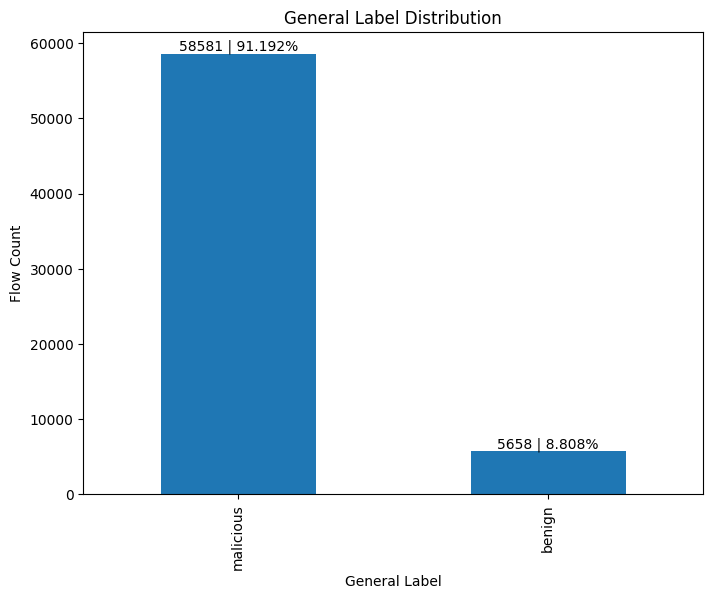

In [437]:
plt.figure(figsize=(8, 6))
bar = (
    ddos_df["General_Label"]
    .value_counts()
    .plot(kind="bar", title="General Label Distribution")
)
for p in bar.patches:
    plt.text(
        p.get_x() + p.get_width() / 2.0,
        p.get_height(),
        f"{p.get_height()} | {(p.get_height() / ddos_df.shape[0]) * 100 :.3f}%",
        ha="center",
        va="bottom",
    )
plt.xlabel("General Label")
plt.ylabel("Flow Count") 
plt.show()

#### Particular attack label distribution

Unique labels: ['ddos_udp_lag' 'ddos_snmp' 'ddos_ssdp' 'ddos_ldap' 'ddos_mssql'
 'ddos_udp' 'ddos_netbios' 'benign' 'ddos_syn' 'ddos_dns' 'ddos_tftp'
 'ddos_ntp']


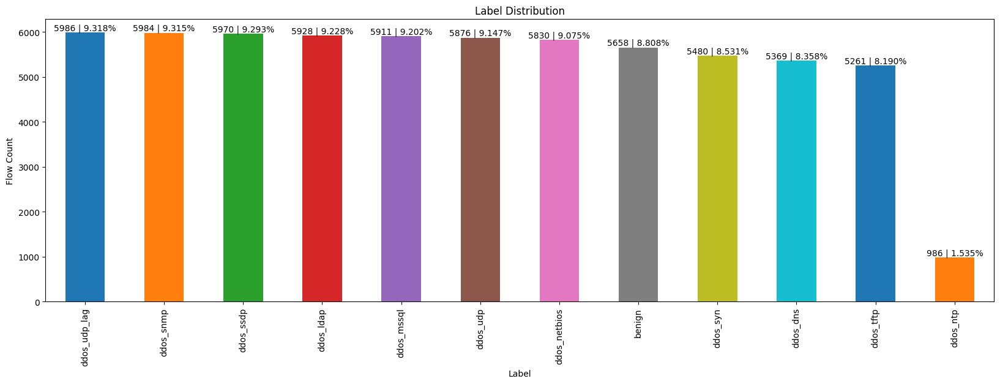

In [438]:
grouped_labels = ddos_df.groupby("label").size().sort_values(ascending=False)
print("Unique labels:", grouped_labels.index.values)

# color_map = 
colors = plt.cm.tab10.colors[:len(grouped_labels.index.values)]    


plt.figure(figsize=(20, 6))
bar = grouped_labels.plot(kind="bar", title="Label Distribution", color=colors)
for p in bar.patches:
    plt.text(
        p.get_x() + p.get_width() / 2.0,
        p.get_height(),
        f"{p.get_height()} | {(p.get_height() / ddos_df.shape[0]) * 100 :.3f}%",
        ha="center",
        va="bottom",
    )

plt.xlabel("Label") 
plt.ylabel("Flow Count")    

plt.show()

#### General Protocol Distribution

Protocol
17    48870
6     15311
0        58
Name: count, dtype: int64


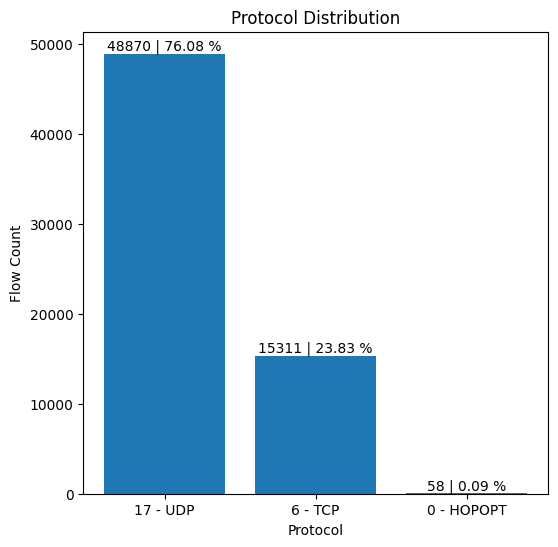

In [439]:
protocol_count_df = ddos_df["Protocol"].value_counts()
print(protocol_count_df)

fig, ax = plt.subplots(figsize=(6, 6))
bars = ax.bar(
    [f"{index} - {protocol_mapping.get(index)}" for index in protocol_count_df.index.values],
    protocol_count_df.values
)

for b in bars:
    h = b.get_height()
    ax.text(
        b.get_x() + b.get_width() / 2.0,
        h,
        f"{h} | {h/ ddos_df.shape[0] * 100 :.2f} %",
        ha="center",
        va="bottom",
    )

ax.set_title("Protocol Distribution") 
ax.set_xlabel("Protocol")   
ax.set_ylabel("Flow Count") 

plt.show()  

[17  0  6]


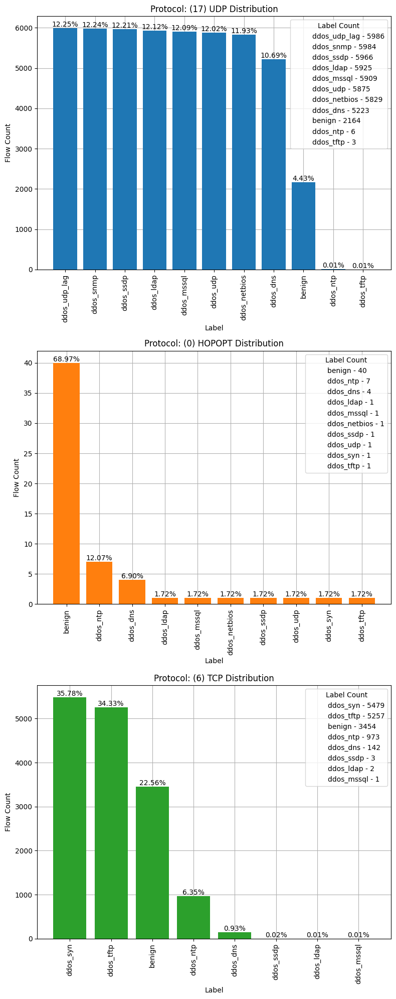

In [440]:
list_protocol = ddos_df["Protocol"].unique()
print(list_protocol)

fig, ax = plt.subplots(3, 1, figsize=(8, 20))

colors =  plt.cm.tab10.colors[:len(list_protocol)]      

for i, p in enumerate(list_protocol):

    ax[i].set_title(f"Protocol: ({p}) {protocol_mapping.get(p)} Distribution")
    x_prot_df = ddos_df[ddos_df["Protocol"] == p]
    res = x_prot_df["label"].value_counts()

    bars = ax[i].bar(res.index, res.values, color=colors[i])    

    handles = [plt.Line2D([0], [0],  linestyle='', label=f"{key} - {value}") 
           for key, value in zip(res.index, res.values)]    
    ax[i].legend(handles=handles, loc="upper right", title="Label Count")       
    ax[i].set_xlabel("Label")
    ax[i].set_ylabel("Flow Count")
    ax[i].grid(True)
    ax[i].set_axisbelow(True)
    for bar in bars:
        h = bar.get_height()
        ax[i].text(
            bar.get_x() + bar.get_width() / 2,
            h,
            f"{h/x_prot_df.shape[0] * 100:.2f}%",
            ha="center",
            va="bottom",
        )
    plt.setp(ax[i].get_xticklabels(), rotation=90)
plt.tight_layout()
plt.show()

## Time-Series Traffic Trends
Time-based trends often expose attack periods as spikes in traffic volume.This visualization shows how the traffic volume fluctuates across different hours of the day.

In [441]:
ddos_df["Timestamp"] = pd.to_datetime(ddos_df["Timestamp"])
day_group = ddos_df.groupby(ddos_df["Timestamp"].dt.date).size()
if day_group.values[-1] == ddos_df.shape[0]:
    print(f"All data flows are captured in the same day at {day_group.index[-1]}")
print(day_group)

initial_timestamp = ddos_df["Timestamp"].min()
final_timestamp = ddos_df["Timestamp"].max()
print("Initial timestamp:", initial_timestamp)
print("Final timestamp:", final_timestamp)
duration:pd.Timedelta = final_timestamp - initial_timestamp
print("Duration of flow capturing event:", duration.total_seconds(), "Seconds")
print("Duration of flow capturing event:", round(duration.total_seconds() / 3600, 2), "Hours")    

All data flows are captured in the same day at 2018-12-01
Timestamp
2018-12-01    64239
dtype: int64
Initial timestamp: 2018-12-01 09:17:11.183810
Final timestamp: 2018-12-01 13:34:27.985351
Duration of flow capturing event: 15436.801541 Seconds
Duration of flow capturing event: 4.29 Hours


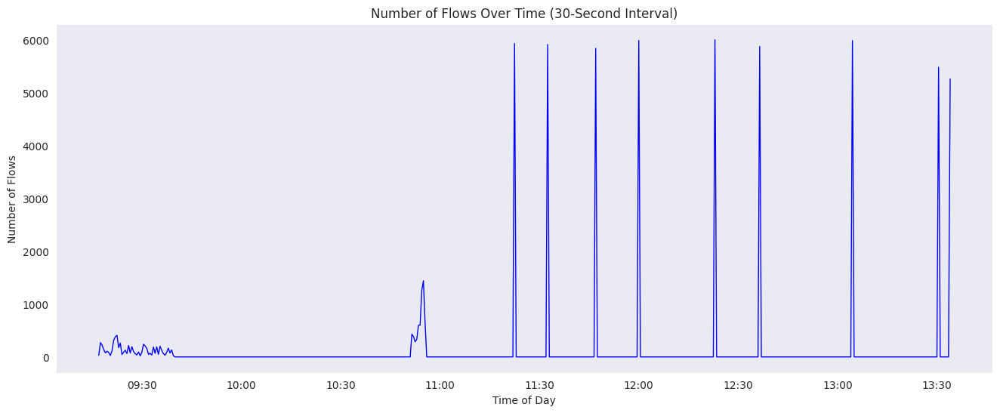

In [442]:

#Aggregate flows over time 
time_aggregated = ddos_df.set_index('Timestamp').resample('30s').size()

# time_aggregated["Timestamp"] = time_aggregated["Timestamp"].dt.time 
# time_aggregated = time_aggregated.set_index("Timestamp")    

# print(time_aggregated)
# # print(time_aggregated.index.dt.time)
# # Plot using Seaborn for a cleaner look
plt.figure(figsize=(16, 6))
sns.set_style("darkgrid")  # Set a grid-based background
plt.plot(time_aggregated.index, time_aggregated.values, color="blue", linewidth=1)

plt.title("Number of Flows Over Time (30-Second Interval)")
plt.ylabel("Number of Flows")
plt.xlabel("Time of Day")
plt.gca().xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%H:%M'))


plt.grid()
plt.show()

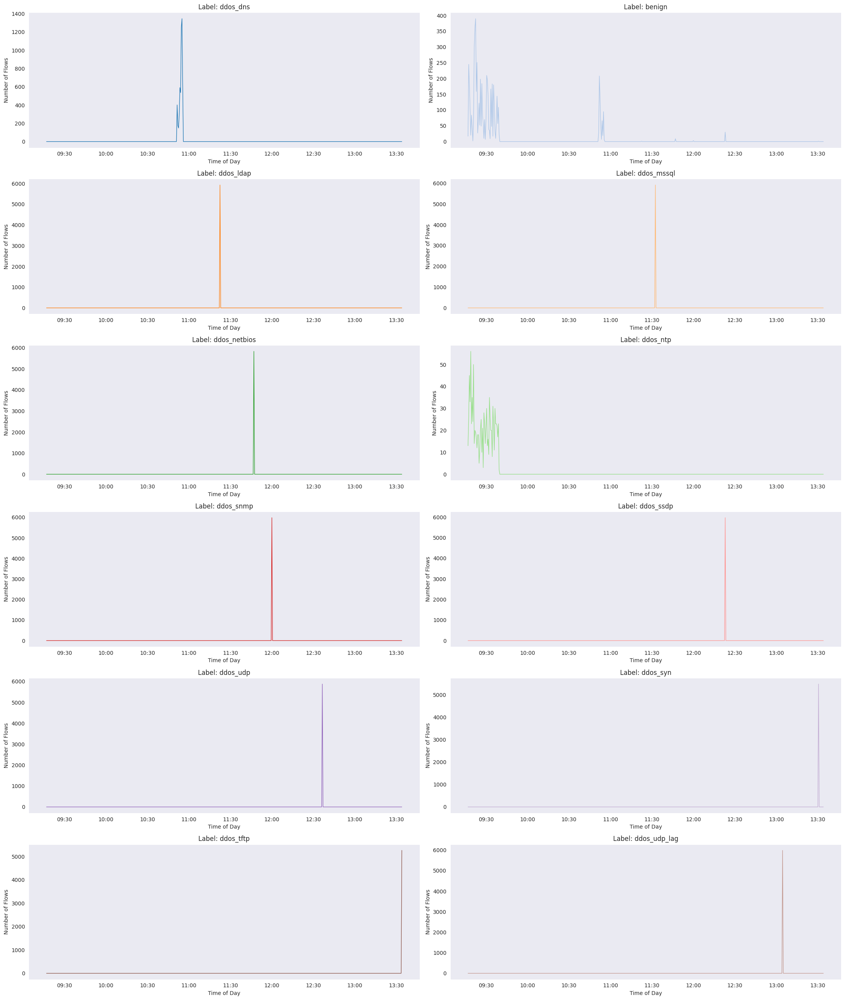

In [443]:
unique_labels = ddos_df["label"].unique()   
colors = plt.cm.tab20.colors[:len(unique_labels)] 
r , c  = len(unique_labels)//2, 2   
fig, ax =  plt.subplots(r, c, figsize=(22, 26))  
time_intervals_val =  ddos_df.set_index('Timestamp').resample('30s').size()
time_intervals_val[:] = 0 

for i, label in enumerate(unique_labels):
    row, col = i//c, i%c        
    label_df = ddos_df[ddos_df["label"] == label]
    time_aggregated:pd.Series = label_df.set_index('Timestamp').resample('30s').size()
    time_aggregated = time_aggregated.add(time_intervals_val, fill_value=0)
    ax[row, col].plot(time_aggregated.index, time_aggregated.values, color= colors[i], linewidth=1) 
    ax[row, col].set_title(f"Label: {label}")
    ax[row, col].set_ylabel("Number of Flows")
    ax[row, col].set_xlabel("Time of Day")
    ax[row, col].grid()
    ax[row, col].xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%H:%M')) 

plt.tight_layout()
plt.show()        



#### General port distribution for source and destination 

/tmp/ipykernel_6968/1652218599.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_source_ports.index, y=top_source_ports.values, palette="coolwarm")


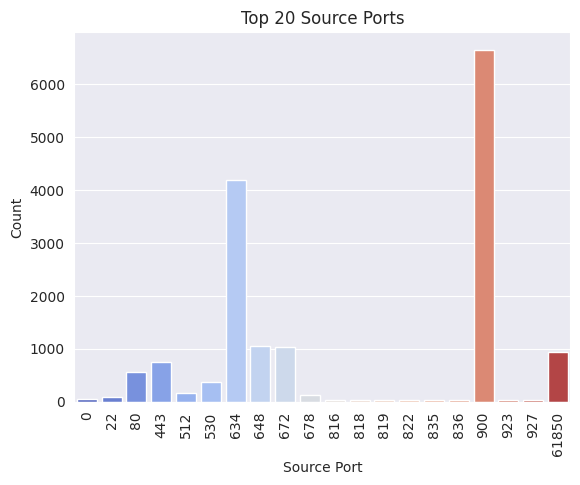

/tmp/ipykernel_6968/1652218599.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_destination_ports.index, y=top_destination_ports.values, palette="coolwarm")


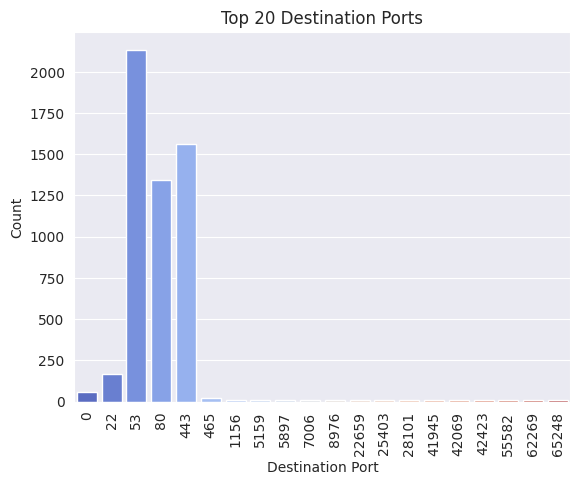

In [444]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot Source Port distribution (top 20 most frequent)
top_source_ports = ddos_df['Source Port'].value_counts().nlargest(20)
sns.barplot(x=top_source_ports.index, y=top_source_ports.values, palette="coolwarm")
plt.title("Top 20 Source Ports")
plt.xlabel("Source Port")
plt.ylabel("Count")
plt.xticks(rotation=90)
plt.show()

# Plot Destination Port distribution (top 20 most frequent)
top_destination_ports = ddos_df['Destination Port'].value_counts().nlargest(20)
sns.barplot(x=top_destination_ports.index, y=top_destination_ports.values, palette="coolwarm")
plt.title("Top 20 Destination Ports")
plt.xlabel("Destination Port")
plt.ylabel("Count")
plt.xticks(rotation=90)
plt.show()


#### ECDF for source port (general) and (classified)

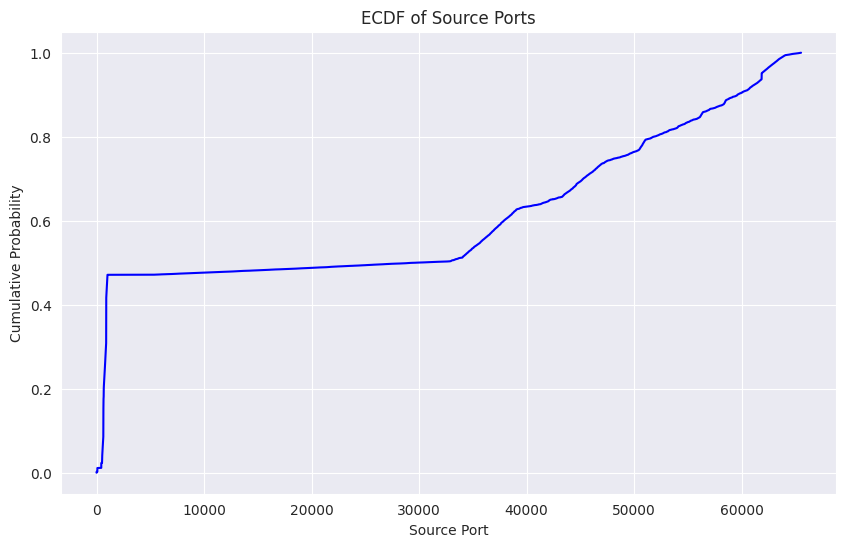

In [445]:

data = ddos_df['Source Port'].sort_values() 
# print(data)
y = np.arange(1, data.size + 1) / data.size

plt.figure(figsize=(10, 6))
plt.plot(data.values, y, linestyle='-', color='b')

plt.title('ECDF of Source Ports')
plt.xlabel('Source Port')
plt.ylabel('Cumulative Probability')

plt.grid(True)
plt.show()      


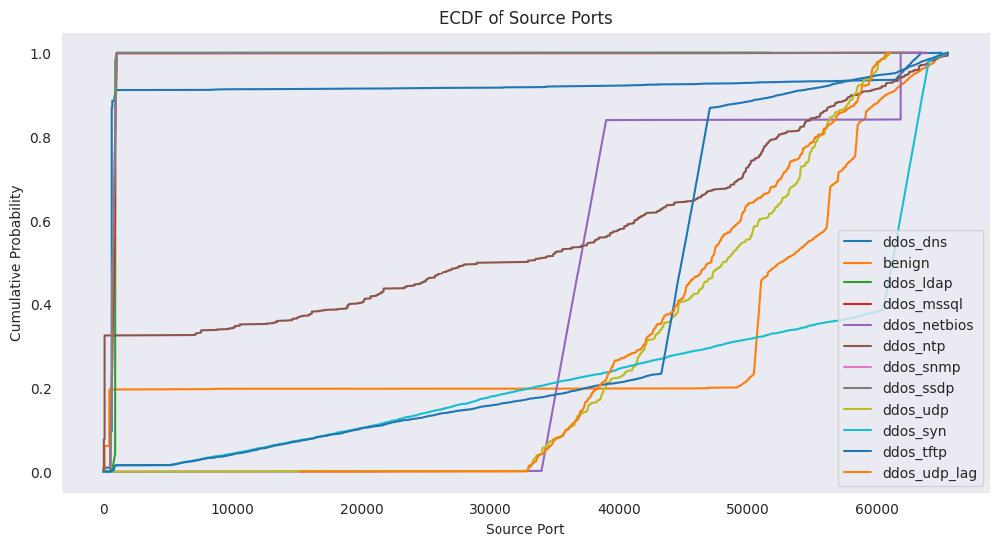

In [446]:
fig, ax = plt.subplots(figsize=(12, 6))

# ECDF for each label
labels = ddos_df['label'].unique()

for label in labels:
    sorted_data = ddos_df[ddos_df['label'] == label]['Source Port'].sort_values()   
    y = np.arange(1, sorted_data.size + 1) / sorted_data.size   
    ax.plot(sorted_data.values, y, label=f'{label}')

ax.set_xlabel('Source Port')
ax.set_ylabel('Cumulative Probability')
ax.set_title('ECDF of Source Ports')
ax.grid()
ax.legend()
plt.show()


#### ECDF for destination port (general) and (classified)

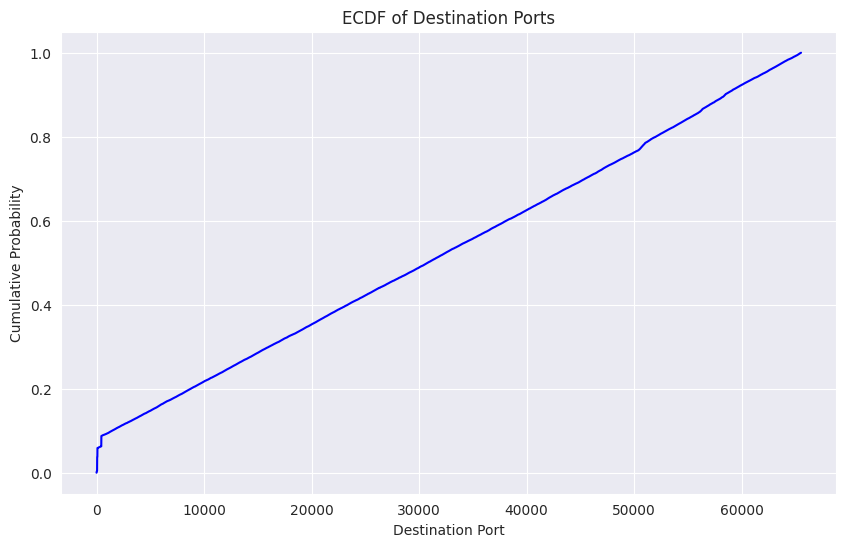

In [447]:
data = ddos_df['Destination Port'].sort_values() 
y = np.arange(1, data.size + 1) / data.size

plt.figure(figsize=(10, 6))
plt.plot(data.values, y, linestyle='-', color='b')

plt.title('ECDF of Destination Ports')
plt.xlabel('Destination Port')
plt.ylabel('Cumulative Probability')

plt.grid(True)
plt.show()      

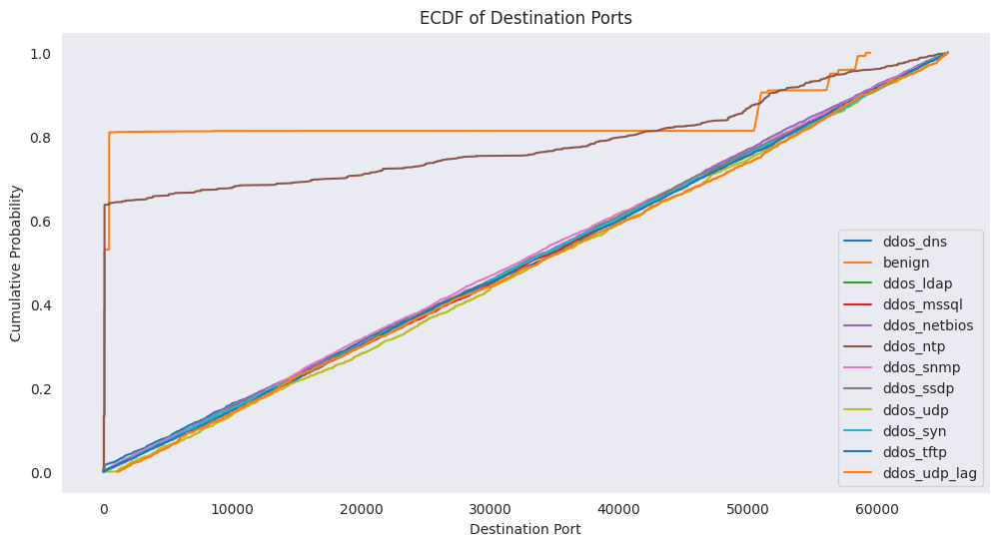

In [448]:
fig, ax = plt.subplots(figsize=(12, 6))

# ECDF for each label
labels = ddos_df['label'].unique()

for label in labels:
    sorted_data = ddos_df[ddos_df['label'] == label]['Destination Port'].sort_values()   
    y = np.arange(1, sorted_data.size + 1) / sorted_data.size   
    ax.plot(sorted_data.values, y, label=f'{label}')

ax.set_xlabel('Destination Port')
ax.set_ylabel('Cumulative Probability')
ax.set_title('ECDF of Destination Ports')
ax.grid()
ax.legend()
plt.show()

#### Calculation of outliers for each feature per label

In [449]:

grouped_labels = ddos_df.groupby("label") 
numerical_features = ddos_df.select_dtypes(include=[np.number]).columns  
outliers_df = pd.DataFrame(columns=['feature', 'label', 'outliers', 'outliers_percentage'])  
row_count = 0
for label, group in grouped_labels:  
    for feature in numerical_features: 
        feature_group = group[feature]  
        q1 = feature_group.quantile(0.25)
        q3 = feature_group.quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        outliers = group[(feature_group < lower_bound) | (feature_group > upper_bound)]
        outliers_percentage = outliers.shape[0] / group.shape[0] * 100
        outliers_df.loc[row_count] = [feature, label, outliers.shape[0], outliers_percentage]    
        row_count += 1  

outliers_df = outliers_df.sort_values(by='outliers_percentage', ascending=False).reset_index(drop=True)
outliers_df



,feature,label,outliers,outliers_percentage
0,Total Backward Packets,benign,2572,45.457759
1,Subflow Bwd Packets,benign,2572,45.457759
2,Average Packet Size,ddos_dns,2292,42.689514
3,Fwd Packet Length Mean,ddos_dns,1974,36.766623
4,Min Packet Length,ddos_dns,1974,36.766623
...,...,...,...,...
835,Bwd Header Length,ddos_udp_lag,0,0.000000
836,Fwd Packets/s,ddos_udp_lag,0,0.000000
837,Bwd Packets/s,ddos_udp_lag,0,0.000000
838,Down/Up Ratio,ddos_udp_lag,0,0.000000


#### Plotting the outliers for each feature related to label 

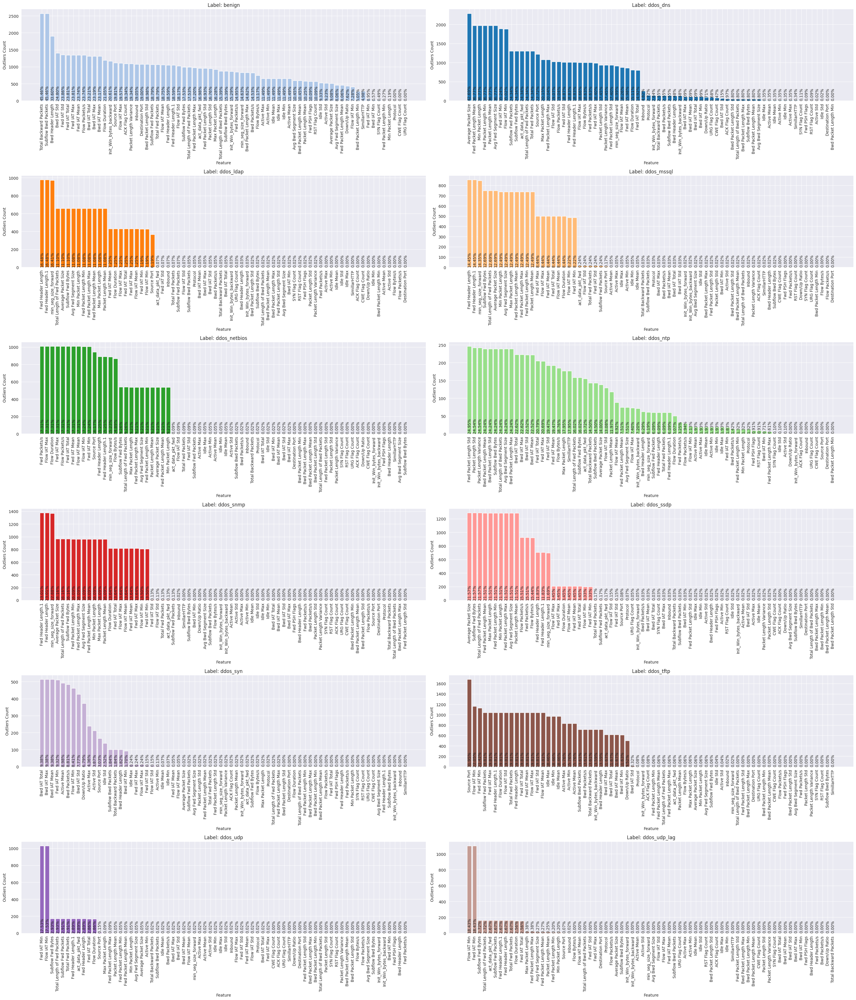

In [450]:
unique_labels = ddos_df["label"].unique()
color_label_map = dict(zip(unique_labels, cm.tab20.colors[:len(unique_labels)]))
r, c = len(unique_labels)//2, 2 
fig, ax = plt.subplots(r, c, figsize=(30,35))

i = 0
for label, group in  outliers_df.groupby("label"):  
    row, col = i//c, i%c
    outliers_df_label = group.loc[:, ["feature", "outliers", "outliers_percentage"]].reset_index()      
    bars = ax[row, col].bar(outliers_df_label["feature"], outliers_df_label["outliers"], color=color_label_map.get(label))
    for j, bar in enumerate(bars):
        percentage = outliers_df_label.loc[j, "outliers_percentage"]     
        ax[row, col].text(
            bar.get_x() + bar.get_width() / 2,
            h,
            f"{percentage:.2f}%",
            ha="center",
            va="bottom",
            rotation=90
        )
    
    ax[row, col].set_title(f"Label: {label}")   
    ax[row, col].set_xlabel("Feature")
    ax[row, col].set_ylabel("Outliers Count")
    ax[row, col].tick_params(axis='x', rotation=90) 
    i += 1
   

plt.tight_layout()  
plt.xticks(rotation=90) 
    
plt.show()

In [451]:
feature_group_outliers = outliers_df.groupby('feature').agg({
    "outliers": "mean", 
    "outliers_percentage": "mean"   
}).rename(columns={"outliers": "outliers_mean", "outliers_percentage": "outliers_percentage_mean" } ).reset_index() 

feature_group_outliers = feature_group_outliers.sort_values(by='outliers_percentage_mean', ascending=False).reset_index(drop=True)  
feature_group_outliers


,feature,outliers_mean,outliers_percentage_mean
0,Flow IAT Min,749.250000,13.360559
1,Fwd IAT Min,721.583333,12.850315
2,Fwd Header Length.1,691.500000,12.491285
3,Fwd Header Length,691.500000,12.491285
4,Average Packet Size,595.916667,11.385801
...,...,...,...
65,Bwd Packet Length Min,23.833333,0.421232
66,Protocol,14.583333,0.359806
67,URG Flag Count,7.916667,0.146690
68,CWE Flag Count,6.666667,0.124013


#### Mean of outlier features distribution

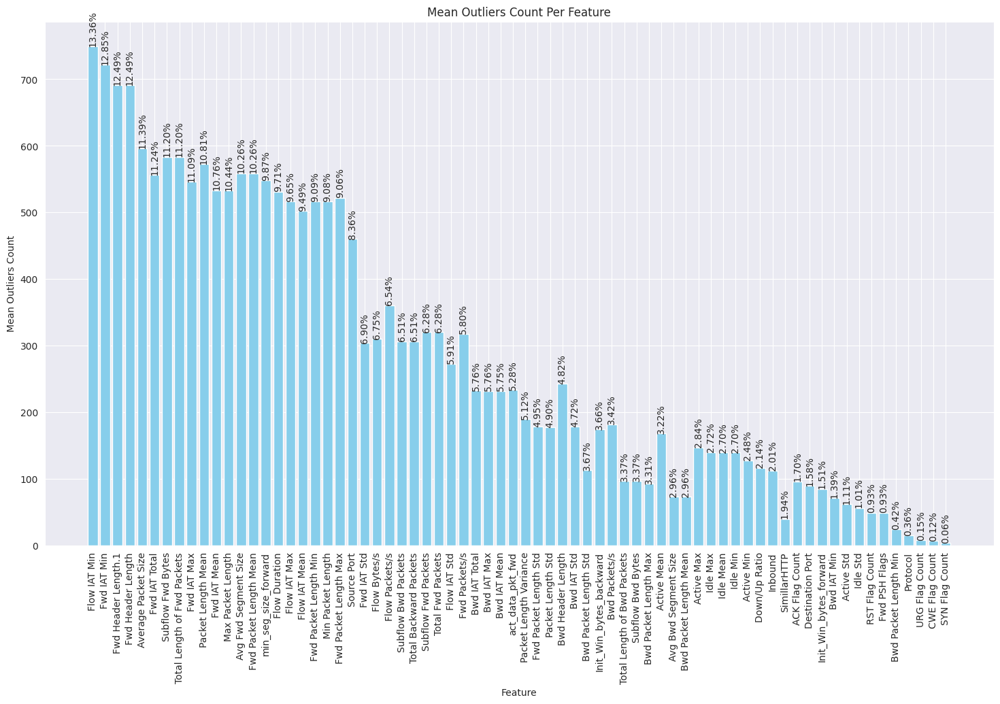

In [452]:

fig, ax = plt.subplots(figsize=(18, 10)) 
bar = ax.bar(feature_group_outliers['feature'], feature_group_outliers['outliers_mean'], color='skyblue')  
for i, bar in enumerate(bar):
    p = feature_group_outliers.loc[i, "outliers_percentage_mean"]       
    ax.text(
        bar.get_x() + bar.get_width() / 2.0,
        bar.get_height(),
        f"{p:.2f}%",
        ha="center",
        va="bottom",
        rotation=90,    

    )
ax.set_title("Mean Outliers Count Per Feature")
ax.set_xlabel("Feature")
ax.set_ylabel("Mean Outliers Count")
plt.xticks(rotation=90)
plt.show()

In [453]:
# selecting 3 features with highest mean outliers percentage
top_features = feature_group_outliers.head(3)['feature'].values 
print("Features with highest mean outliers percentage:", top_features)  

#selecting with lowest mean outliers percentage 
bottom_features = feature_group_outliers.tail(3)['feature'].values      
print("Features with lowest mean outliers percentage:", bottom_features)

mean_outliers = feature_group_outliers['outliers_percentage_mean'].mean()     
# print("Mean Outliers Count:", mean_outliers)     

feature_group_outliers['outliers_mean_dist'] = (feature_group_outliers['outliers_percentage_mean'] - mean_outliers).abs()
feature_group_outliers = feature_group_outliers.sort_values(by='outliers_mean_dist', ascending=True)       



# selecting 3 features with nearest mean outliers count to the overall mean 
near_mean_features = feature_group_outliers.head(3)['feature'].values
print("Features with nearest mean outliers distance:", near_mean_features)


Features with highest mean outliers percentage: ['Flow IAT Min' 'Fwd IAT Min' 'Fwd Header Length.1']
Features with lowest mean outliers percentage: ['URG Flag Count' 'CWE Flag Count' 'SYN Flag Count']
Features with nearest mean outliers distance: ['Bwd IAT Mean' 'Bwd IAT Max' 'Bwd IAT Total']


#### Boxplot of Top Features with Highest Mean Outliers Percentage

Label: ['ddos_dns' 'benign' 'ddos_ldap' 'ddos_mssql' 'ddos_netbios' 'ddos_ntp'
 'ddos_snmp' 'ddos_ssdp' 'ddos_udp' 'ddos_syn' 'ddos_tftp' 'ddos_udp_lag']


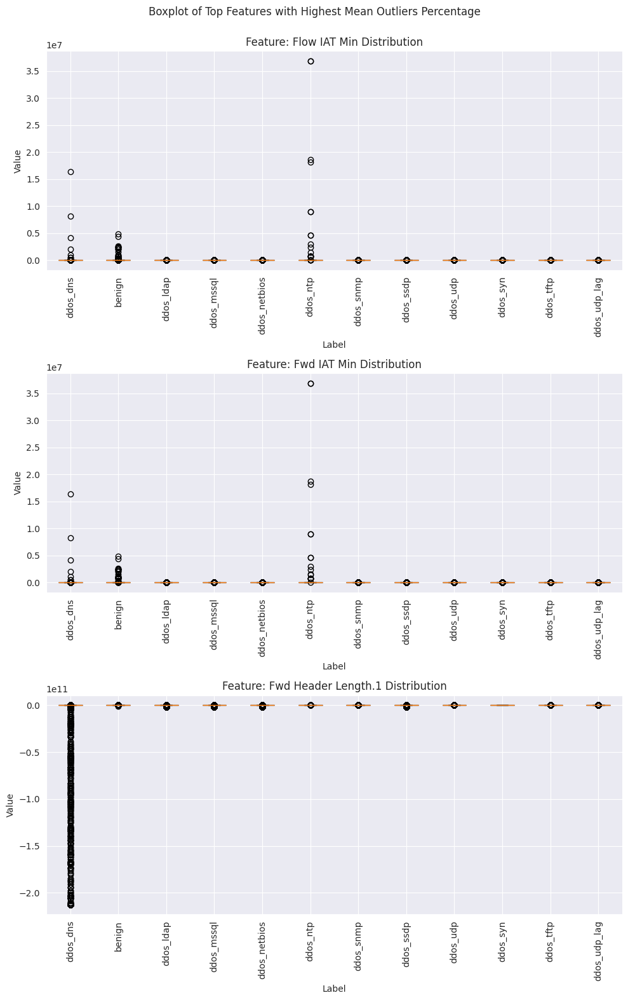

In [454]:
print("Label:", unique_labels)
fig, ax = plt.subplots(len(top_features), 1, figsize=(10, 16))
fig.suptitle("Boxplot of Top Features with Highest Mean Outliers Percentage")
for i, feature in enumerate(top_features):
    data_to_plot = [
        ddos_df[ddos_df["label"] == label][feature].values for label in unique_labels
    ]
    ax[i].boxplot(data_to_plot, patch_artist=True)  
    ax[i].set_title(f"Feature: {feature} Distribution")
    ax[i].set_xlabel("Label")
    ax[i].set_ylabel("Value")
    ax[i].set_xticklabels(unique_labels)    
    ax[i].tick_params(axis='x', rotation=90) 

plt.tight_layout(rect=[0, 0, 1, 0.98]) 
plt.show()  


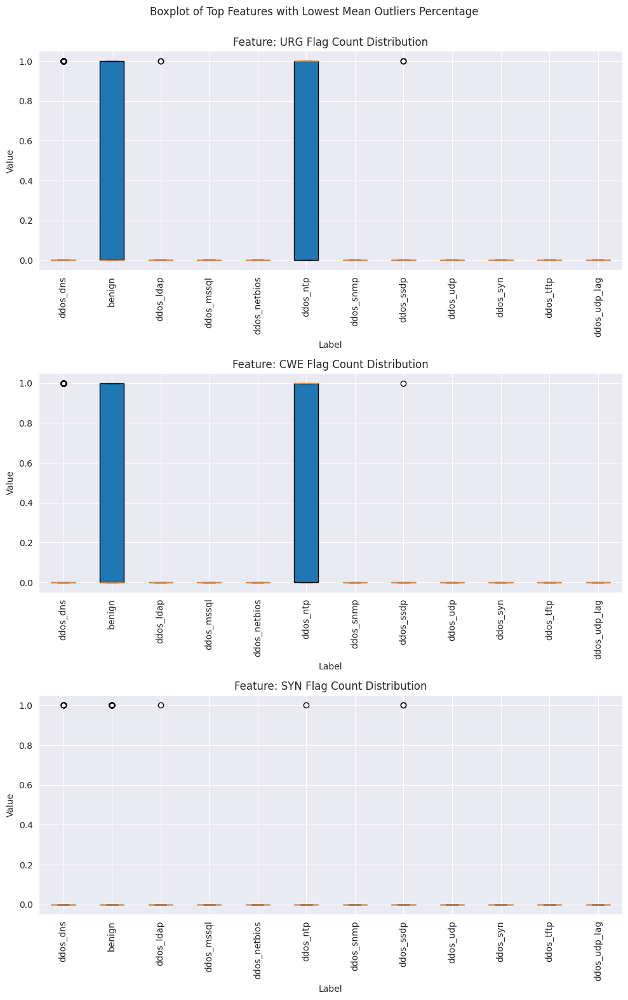

In [455]:
fig, ax = plt.subplots(len(bottom_features), 1, figsize=(10, 16))
fig.suptitle("Boxplot of Top Features with Lowest Mean Outliers Percentage")
for i, feature in enumerate(bottom_features):
    data_to_plot = [
        ddos_df[ddos_df["label"] == label][feature].values for label in unique_labels
    ]
    ax[i].boxplot(data_to_plot, patch_artist=True)  
    ax[i].set_title(f"Feature: {feature} Distribution")
    ax[i].set_xlabel("Label")
    ax[i].set_ylabel("Value")
    ax[i].set_xticklabels(unique_labels)    
    ax[i].tick_params(axis='x', rotation=90) 

plt.tight_layout(rect=[0, 0, 1, 0.98]) 
plt.show()  

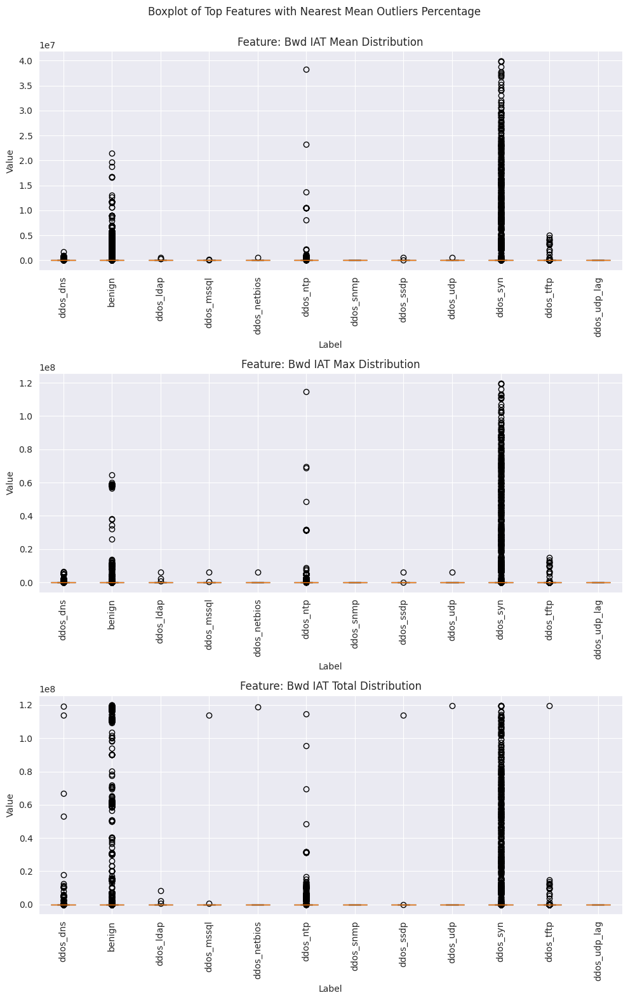

In [456]:
fig, ax = plt.subplots(len(near_mean_features), 1, figsize=(10, 16))
fig.suptitle("Boxplot of Top Features with Nearest Mean Outliers Percentage")
for i, feature in enumerate(near_mean_features):
    data_to_plot = [
        ddos_df[ddos_df["label"] == label][feature].values for label in unique_labels
    ]
    ax[i].boxplot(data_to_plot, patch_artist=True)  
    ax[i].set_title(f"Feature: {feature} Distribution")
    ax[i].set_xlabel("Label")
    ax[i].set_ylabel("Value")
    ax[i].set_xticklabels(unique_labels)    
    ax[i].tick_params(axis='x', rotation=90) 

plt.tight_layout(rect=[0, 0, 1, 0.98]) 
plt.show()  

In [457]:
label_group_outliers_df = outliers_df.groupby('label').agg({
    "outliers": "mean", 
    "outliers_percentage": "mean"   
}).rename(columns={"outliers": "outliers_mean", "outliers_percentage": "outliers_percentage_mean" } ).reset_index()

label_group_outliers_df = label_group_outliers_df.sort_values(by='outliers_percentage_mean', ascending=False)   
label_group_outliers_df

,label,outliers_mean,outliers_percentage_mean
0,benign,852.628571,15.069434
1,ddos_dns,634.728571,11.822100
5,ddos_ntp,94.600000,9.594320
9,ddos_tftp,406.800000,7.732370
4,ddos_netbios,285.571429,4.898309
6,ddos_snmp,290.257143,4.850554
7,ddos_ssdp,278.114286,4.658531
3,ddos_mssql,201.000000,3.400440
2,ddos_ldap,190.971429,3.221515
8,ddos_syn,79.028571,1.442127


In [458]:
numerical_features = [feature for feature in ddos_df.columns if ddos_df[feature].dtype != 'O']
print("Numerical Features:", numerical_features)

category_features = [feature for feature in ddos_df.columns if ddos_df[feature].dtype == 'O']
print("Category Features:", category_features)  

Numerical Features: ['Source Port', 'Destination Port', 'Protocol', 'Timestamp', 'Flow Duration', 'Total Fwd Packets', 'Total Backward Packets', 'Total Length of Fwd Packets', 'Total Length of Bwd Packets', 'Fwd Packet Length Max', 'Fwd Packet Length Min', 'Fwd Packet Length Mean', 'Fwd Packet Length Std', 'Bwd Packet Length Max', 'Bwd Packet Length Min', 'Bwd Packet Length Mean', 'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s', 'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min', 'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max', 'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std', 'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Fwd Header Length', 'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s', 'Min Packet Length', 'Max Packet Length', 'Packet Length Mean', 'Packet Length Std', 'Packet Length Variance', 'SYN Flag Count', 'RST Flag Count', 'ACK Flag Count', 'URG Flag Count', 'CWE Flag Count', 'Down/Up Ratio', 'Average Packet Size', 'A

In [459]:
copy_ddos_df = ddos_df.copy()   

print("Initial shape:", copy_ddos_df.shape) 

copy_ddos_df = copy_ddos_df.drop(columns=category_features)

print("Shape after dropping category features:", copy_ddos_df.shape)    

Initial shape: (64239, 76)
Shape after dropping category features: (64239, 71)


In [460]:
df_label = pd.DataFrame(ddos_df['label'])

# Applying LabelEncoder to each categorical column
label_encoder = LabelEncoder()
for feature in category_features:
    if feature == 'label':
        df_label['intLabel'] = label_encoder.fit_transform(ddos_df[feature])
    else:  
        ddos_df[feature] = label_encoder.fit_transform(ddos_df[feature])

reference_date = pd.to_datetime('2018-12-01 10:51:39.813448')
ddos_df['Timestamp'] = (ddos_df['Timestamp'] - reference_date).dt.total_seconds()

In [461]:
min_timestamp = copy_ddos_df['Timestamp'].min() 
copy_ddos_df['Timestamp'] = (copy_ddos_df['Timestamp'] - min_timestamp).dt.total_seconds()

#### Correlation matrix for features  

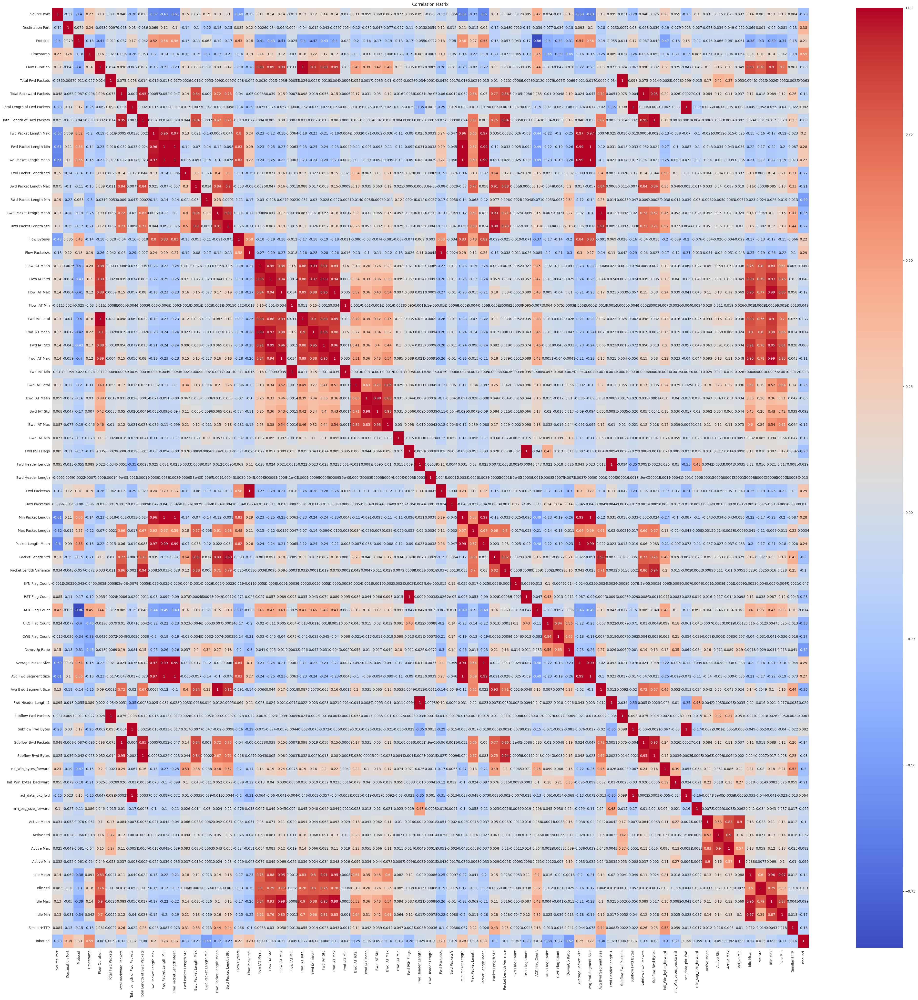

In [462]:
correction_matrix = copy_ddos_df.corr() 

plt.figure(figsize=(50, 50))
sns.heatmap(correction_matrix, annot=True, cmap="coolwarm")
plt.title("Correlation Matrix")
plt.show()


In [463]:
import numpy as np

# Convert all values in the correction matrix to absolute values
correction_matrix = correction_matrix.abs()

# Create the upper triangle of the correction matrix
upper_triangle = correction_matrix.where(np.triu(np.ones(correction_matrix.shape), k=1).astype(bool))

# Identify columns with correlation greater than 0.80 to drop
to_drop = [column for column in upper_triangle.columns if any(upper_triangle[column] > 0.80)]

# Print the results
print("Columns to drop:", to_drop)
print(f"Size of columns to drop: {len(to_drop)} out of {correction_matrix.shape[1]}")


Columns to drop: ['Total Length of Bwd Packets', 'Fwd Packet Length Min', 'Fwd Packet Length Mean', 'Bwd Packet Length Max', 'Bwd Packet Length Mean', 'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max', 'Fwd IAT Min', 'Bwd IAT Std', 'Bwd IAT Max', 'Fwd Packets/s', 'Min Packet Length', 'Packet Length Mean', 'Packet Length Std', 'Packet Length Variance', 'RST Flag Count', 'ACK Flag Count', 'CWE Flag Count', 'Average Packet Size', 'Avg Fwd Segment Size', 'Avg Bwd Segment Size', 'Fwd Header Length.1', 'Subflow Fwd Packets', 'Subflow Fwd Bytes', 'Subflow Bwd Packets', 'Subflow Bwd Bytes', 'act_data_pkt_fwd', 'Active Max', 'Active Min', 'Idle Mean', 'Idle Max', 'Idle Min']
Size of columns to drop: 39 out of 71


New shape: (64239, 32)


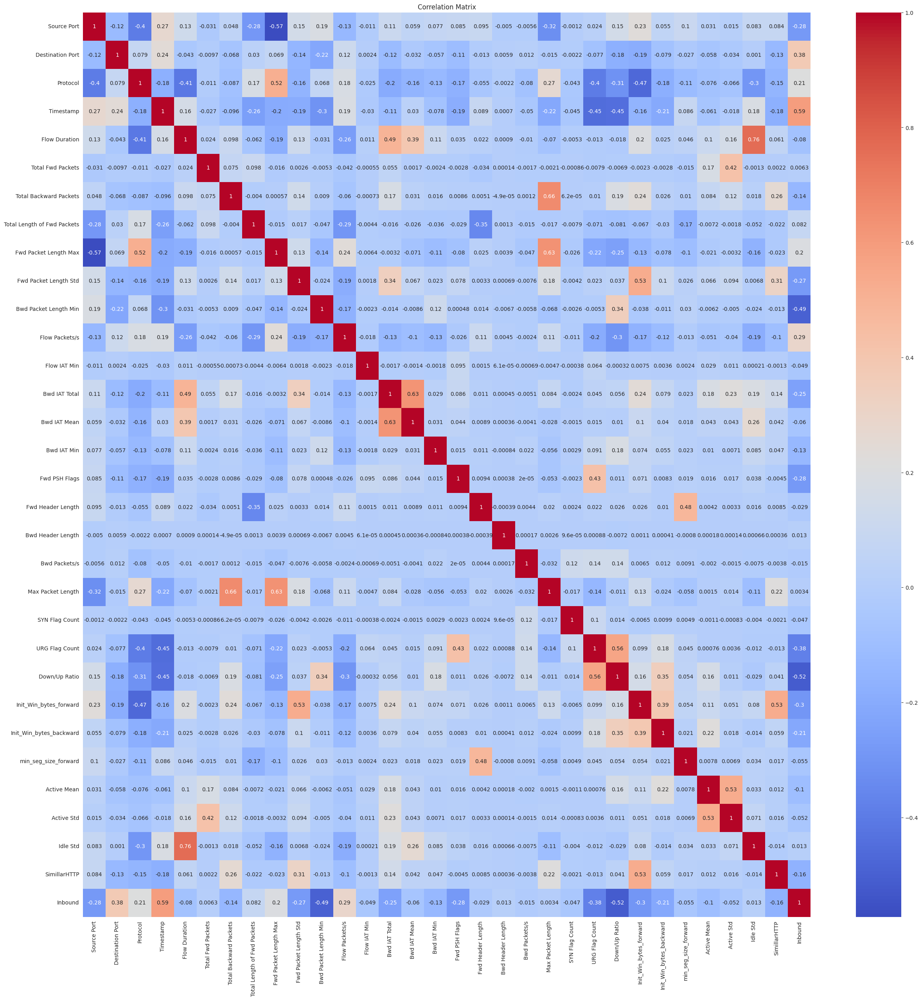

In [464]:
new_ddos_df = copy_ddos_df.drop(columns=to_drop)    
print("New shape:", new_ddos_df.shape)

correction_matrix = new_ddos_df.corr()  

plt.figure(figsize=(30, 30))
sns.heatmap(correction_matrix, annot=True, cmap="coolwarm")
plt.title("Correlation Matrix")
plt.show()

In [465]:
new_feature_group_outliers = feature_group_outliers[feature_group_outliers['feature'].isin(new_ddos_df.columns)]
new_feature_group_outliers = new_feature_group_outliers.sort_values(by='outliers_percentage_mean', ascending=False).reset_index(drop=True) 
new_feature_group_outliers.drop(columns=['outliers_mean_dist'], inplace=True)   
new_feature_group_outliers

,feature,outliers_mean,outliers_percentage_mean
0,Flow IAT Min,749.250000,13.360559
1,Fwd Header Length,691.500000,12.491285
2,Total Length of Fwd Packets,583.250000,11.200896
3,Max Packet Length,532.583333,10.442175
4,min_seg_size_forward,548.333333,9.868519
5,Flow Duration,531.250000,9.711402
6,Fwd Packet Length Max,522.166667,9.064217
7,Source Port,460.500000,8.362985
8,Flow Packets/s,360.750000,6.544217
9,Total Backward Packets,306.500000,6.509771


In [466]:
# selecting 3 features with highest mean outliers percentage
new_top_features = new_feature_group_outliers.head(3)['feature'].values 
print("Features with highest mean outliers percentage:", new_top_features)  

#selecting with lowest mean outliers percentage 
new_bottom_features = new_feature_group_outliers.tail(3)['feature'].values      
print("Features with lowest mean outliers percentage:", new_bottom_features)

mean_outliers = new_feature_group_outliers['outliers_percentage_mean'].mean()     
print("Mean Outliers Count:", mean_outliers)     

new_feature_group_outliers['outliers_mean_dist'] = (new_feature_group_outliers['outliers_percentage_mean'] - mean_outliers).abs()
new_feature_group_outliers = new_feature_group_outliers.sort_values(by='outliers_mean_dist', ascending=True)       



# selecting 3 features with nearest mean outliers count to the overall mean 
new_near_mean_features = new_feature_group_outliers.head(3)['feature'].values
print("Features with nearest mean outliers distance:", new_near_mean_features)


Features with highest mean outliers percentage: ['Flow IAT Min' 'Fwd Header Length' 'Total Length of Fwd Packets']
Features with lowest mean outliers percentage: ['Protocol' 'URG Flag Count' 'SYN Flag Count']
Mean Outliers Count: 4.839154949069643
Features with nearest mean outliers distance: ['Bwd Header Length' 'Fwd Packet Length Std' 'Bwd IAT Mean']


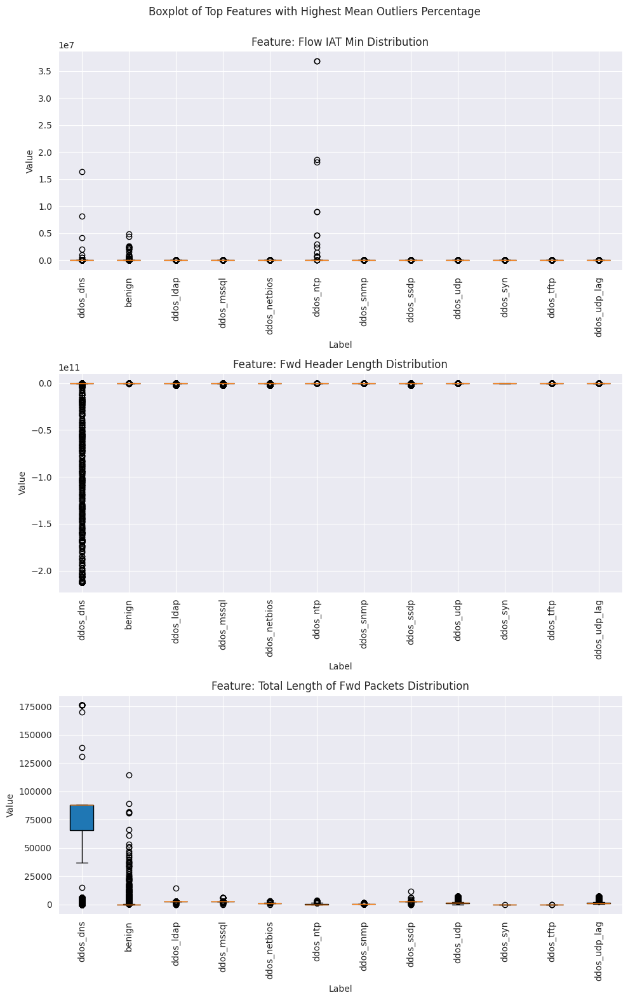

In [467]:
fig, ax = plt.subplots(len(new_top_features), 1, figsize=(10, 16))
fig.suptitle("Boxplot of Top Features with Highest Mean Outliers Percentage")
for i, feature in enumerate(new_top_features):
    data_to_plot = [
        ddos_df[ddos_df["label"] == label][feature].values for label in unique_labels
    ]
    ax[i].boxplot(data_to_plot, patch_artist=True)  
    ax[i].set_title(f"Feature: {feature} Distribution")
    ax[i].set_xlabel("Label")
    ax[i].set_ylabel("Value")
    ax[i].set_xticklabels(unique_labels)    
    ax[i].tick_params(axis='x', rotation=90) 

plt.tight_layout(rect=[0, 0, 1, 0.98]) 
plt.show()  

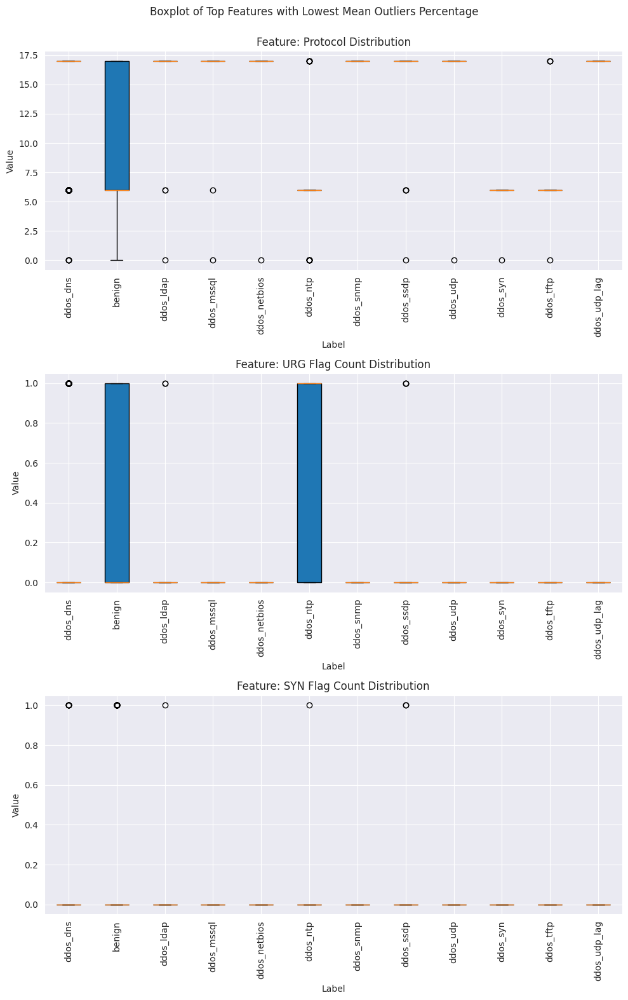

In [468]:
fig, ax = plt.subplots(len(new_bottom_features), 1, figsize=(10, 16))
fig.suptitle("Boxplot of Top Features with Lowest Mean Outliers Percentage")
for i, feature in enumerate(new_bottom_features):
    data_to_plot = [
        ddos_df[ddos_df["label"] == label][feature].values for label in unique_labels
    ]
    ax[i].boxplot(data_to_plot, patch_artist=True)  
    ax[i].set_title(f"Feature: {feature} Distribution")
    ax[i].set_xlabel("Label")
    ax[i].set_ylabel("Value")
    ax[i].set_xticklabels(unique_labels)    
    ax[i].tick_params(axis='x', rotation=90) 

plt.tight_layout(rect=[0, 0, 1, 0.98]) 
plt.show()  

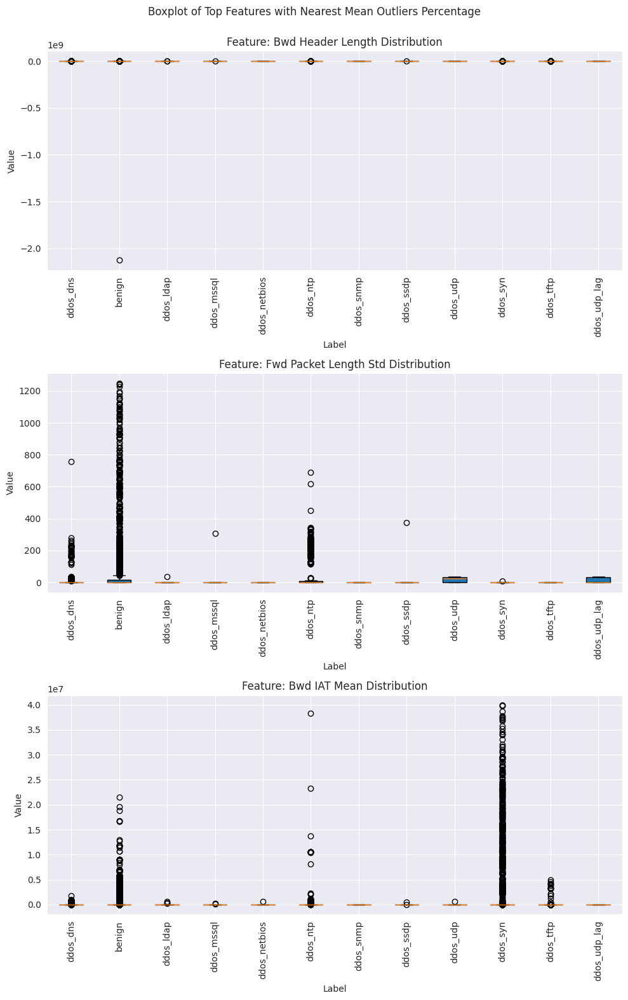

In [469]:
fig, ax = plt.subplots(len(new_near_mean_features), 1, figsize=(10, 16))
fig.suptitle("Boxplot of Top Features with Nearest Mean Outliers Percentage")
for i, feature in enumerate(new_near_mean_features):
    data_to_plot = [
        ddos_df[ddos_df["label"] == label][feature].values for label in unique_labels
    ]
    ax[i].boxplot(data_to_plot, patch_artist=True)  
    ax[i].set_title(f"Feature: {feature} Distribution")
    ax[i].set_xlabel("Label")
    ax[i].set_ylabel("Value")
    ax[i].set_xticklabels(unique_labels)    
    ax[i].tick_params(axis='x', rotation=90) 

plt.tight_layout(rect=[0, 0, 1, 0.98]) 
plt.show()  

### PCA

In [470]:
print("New shape:", new_ddos_df.shape)  
new_ddos_df

New shape: (64239, 32)


,Source Port,Destination Port,Protocol,Timestamp,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Fwd Packet Length Max,Fwd Packet Length Std,...,URG Flag Count,Down/Up Ratio,Init_Win_bytes_forward,Init_Win_bytes_backward,min_seg_size_forward,Active Mean,Active Std,Idle Std,SimillarHTTP,Inbound
0,634,60495,17,5668.629638,28415,97,0,42680.0,440.0,0.000000,...,0,0.0,-1,-1,-1,0.0,0.0,0.0,0,1
1,634,60495,17,5668.637032,2,2,0,880.0,440.0,0.000000,...,0,0.0,-1,-1,-1,0.0,0.0,0.0,0,0
2,634,46391,17,5668.668689,48549,200,0,88000.0,440.0,0.000000,...,0,0.0,-1,-1,-1,0.0,0.0,0.0,0,1
3,634,11894,17,5668.706403,48337,200,0,88000.0,440.0,0.000000,...,0,0.0,-1,-1,-1,0.0,0.0,0.0,0,1
4,634,27878,17,5668.757341,32026,200,0,88000.0,440.0,0.000000,...,0,0.0,-1,-1,-1,0.0,0.0,0.0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64234,38625,63051,17,13655.444439,1,2,0,750.0,375.0,0.000000,...,0,0.0,-1,-1,-1,0.0,0.0,0.0,0,1
64235,58632,18963,17,13655.445153,212238,6,0,2088.0,393.0,35.088460,...,0,0.0,-1,-1,-1,0.0,0.0,0.0,0,1
64236,46104,64704,17,13655.445204,1,2,0,750.0,375.0,0.000000,...,0,0.0,-1,-1,-1,0.0,0.0,0.0,0,1
64237,60686,10440,17,13655.445206,108952,4,0,1438.0,389.0,34.063666,...,0,0.0,-1,-1,-1,0.0,0.0,0.0,0,1


Cumulative explained variance percentage: [ 13.15273233  22.03361554  29.97812472  35.98934445  41.24999424
  46.12059692  50.71173235  54.69815022  58.38489676  61.85218546
  65.25597374  68.38035849  71.4570543   74.45781484  77.32498057
  80.04409078  82.53639183  84.9281748   87.13346532  89.19523478
  90.90455854  92.36424991  93.69140857  94.90248284  95.94515634
  96.86349939  97.71380824  98.38211656  98.97842785  99.42468491
  99.75681204 100.        ]
Number of components to keep: 12


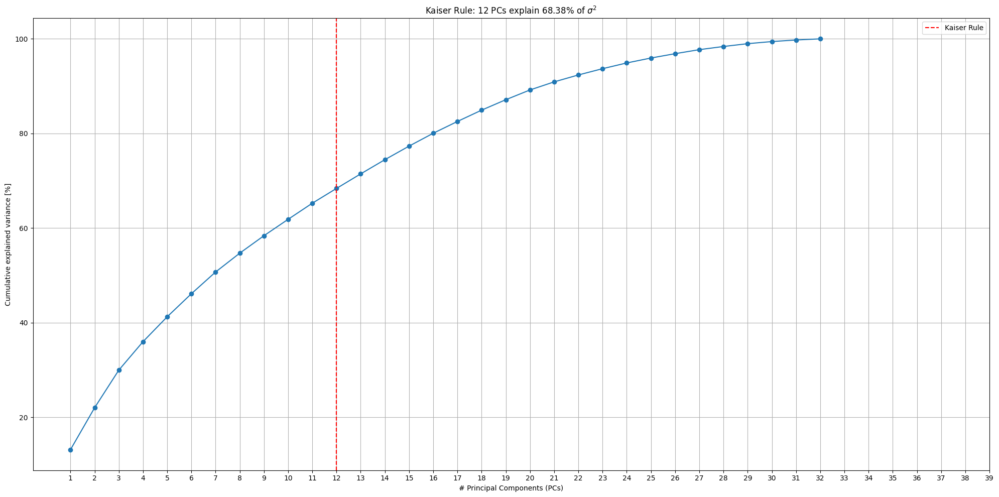

In [471]:
scale = StandardScaler()
scaled_data = scale.fit_transform(new_ddos_df)
pca = PCA()
pca = pca.fit(scaled_data)

# Using Kaiser's rule to determine the number of components to keep 
cum_variance_percentage = np.cumsum(pca.explained_variance_ratio_) * 100
print("Cumulative explained variance percentage:", cum_variance_percentage)
nr_components = np.sum(pca.explained_variance_ > 1) + 1     
print("Number of components to keep:", nr_components)

plt.rcdefaults()
plt.figure(figsize=(20, 10))
plt.plot(cum_variance_percentage, marker='o')
plt.title(f'Kaiser Rule: {nr_components} PCs explain {round(cum_variance_percentage[nr_components - 1], 2)}% of $\sigma^2$')
plt.axvline(x=nr_components - 1, color='red', linestyle='--', label='Kaiser Rule')
plt.xlabel('# Principal Components (PCs)')
plt.xticks([i for i in range(39)], [i for i in range(1,40)])
plt.ylabel('Cumulative explained variance [%]')
plt.grid()


plt.legend()

plt.tight_layout()
plt.show()  

In [472]:
nr_pca_components = 12 
pca = PCA(n_components=nr_pca_components, random_state=22)
pca_data = pca.fit_transform(scaled_data)   
#print(pca_data)
pca_ddos_df = pd.DataFrame(data=pca_data, columns=[f"PC{i}" for i in range(1, nr_pca_components + 1)])   
pca_ddos_df['label'] = ddos_df['label'].values
pca_ddos_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,label
0,0.767441,-0.629539,-0.086107,1.477873,-0.382187,0.220547,-0.290894,0.379304,0.693044,1.381814,0.751789,-0.027076,ddos_dns
1,-0.346203,-1.122489,-0.671046,0.249542,0.121929,-0.799459,0.221211,-0.288085,0.161605,0.162038,0.093267,-0.007192,ddos_dns
2,0.751729,-1.024041,-0.030622,2.456343,-0.734187,0.667954,-0.072120,0.261794,0.792790,2.047598,1.309996,-0.033036,ddos_dns
3,0.451114,-1.236055,-0.092667,2.398279,-0.754170,0.585518,0.384820,-0.076054,0.686832,1.975544,1.397132,-0.022320,ddos_dns
4,0.591097,-1.138002,-0.064032,2.424454,-0.744444,0.623708,0.172779,0.080017,0.735693,2.008036,1.356409,-0.027259,ddos_dns
...,...,...,...,...,...,...,...,...,...,...,...,...,...
64234,1.164697,1.014167,-0.181563,-0.617396,0.418162,0.279421,-0.175303,0.019775,-0.147297,-0.433180,-0.190148,0.003307,ddos_udp_lag
64235,-0.029178,0.806229,-0.265045,-0.351905,-0.055522,0.607246,0.916222,-0.328534,-0.144179,0.173571,0.414036,0.001358,ddos_udp_lag
64236,1.113604,1.099688,-0.220954,-0.677086,0.425546,0.344770,-0.121502,0.008116,-0.201767,-0.484746,-0.196835,0.005035,ddos_udp_lag
64237,-0.119614,0.783723,-0.302907,-0.395061,-0.051153,0.596441,1.049634,-0.415482,-0.190571,0.128687,0.424257,0.004799,ddos_udp_lag


In [473]:
loadings = pca.components_

# Display top features for each principal component
for i in range(nr_components):
    pc_loadings = pd.DataFrame(loadings[i], index=new_ddos_df.columns, columns=[f'PC{i}_Loading'])
    pc_loadings_sorted = pc_loadings.abs().sort_values(by=f'PC{i}_Loading', ascending=False)

    print(f"Top 5 features for PC{i}:")
    print(pc_loadings_sorted.head())
    print("\n" + "="*40 + "\n")

Top 5 features for PC0:
                        PC0_Loading
Inbound                    0.344371
Protocol                   0.313329
Init_Win_bytes_forward     0.294311
Down/Up Ratio              0.290120
URG Flag Count             0.241704


Top 5 features for PC1:
                       PC1_Loading
Timestamp                 0.453956
Max Packet Length         0.345713
Idle Std                  0.308148
Fwd Packet Length Max     0.305362
Flow Duration             0.303760


Top 5 features for PC2:
                        PC2_Loading
Max Packet Length          0.362902
Bwd IAT Total              0.325960
Fwd Packet Length Max      0.276489
Flow Duration              0.273135
Total Backward Packets     0.265492


Top 5 features for PC3:
                             PC3_Loading
Total Length of Fwd Packets     0.432041
Fwd Header Length               0.413101
min_seg_size_forward            0.324146
Flow Packets/s                  0.257462
Init_Win_bytes_forward          0.231637


Top 5 fe

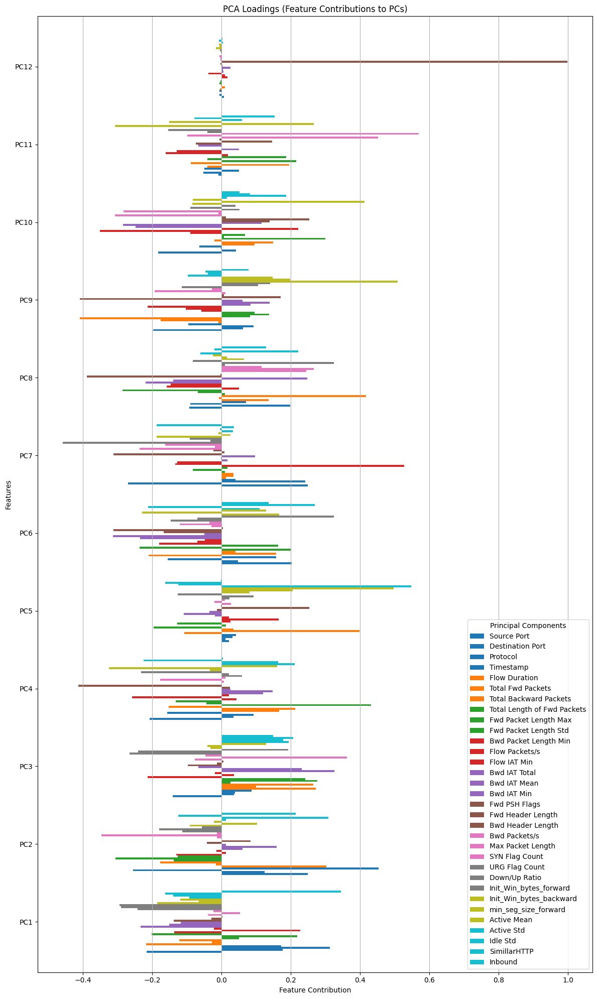

In [474]:
loadings = pd.DataFrame(loadings, columns=new_ddos_df.columns, index=[f"PC{i}" for i in range(1, nr_pca_components + 1)])   


loadings.plot(kind='barh', figsize=(12, 20), width=0.8, cmap='tab10')
plt.title("PCA Loadings (Feature Contributions to PCs)")
plt.xlabel("Feature Contribution")
plt.ylabel("Features")
plt.legend(title="Principal Components")
plt.grid(axis='x')  
plt.tight_layout()
plt.show()

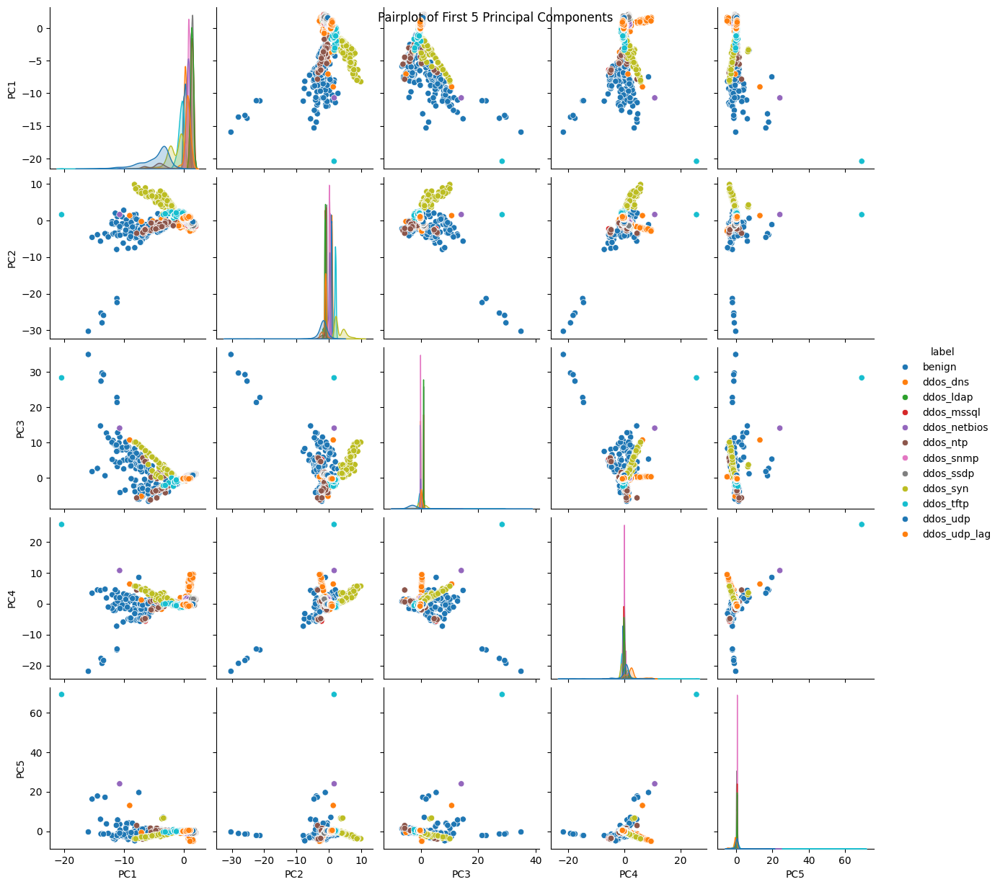

In [475]:
nr_pca_for_plot = 5
data_for_plot = pca_ddos_df.iloc[:, 0:nr_pca_for_plot].copy()   

data_for_plot["label"] = pca_ddos_df["label"].values

samples = []
for label, group in data_for_plot.groupby('label'):
    samples.append(group.sample(frac=0.1, random_state=42)) 

sample_data =  pd.concat(samples).reset_index(drop=True)            

g = sns.pairplot(sample_data, hue="label", palette="tab10")

g.figure.suptitle("Pairplot of First 5 Principal Components")  
# g.figure.set_size_inches(50, 50)
plt.show()

### Section 2


In [476]:
# print(df_label["intLabel"].shape)
# print(new_ddos_df.shape)
# print(new_ddos_df["Timestamp"])

scale = StandardScaler()
columns = new_ddos_df.columns
scaled_data = scale.fit_transform(new_ddos_df)
new_ddos_df = pd.DataFrame(data=scaled_data, columns=columns)
new_ddos_df

,Source Port,Destination Port,Protocol,Timestamp,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Fwd Packet Length Max,Fwd Packet Length Std,...,URG Flag Count,Down/Up Ratio,Init_Win_bytes_forward,Init_Win_bytes_backward,min_seg_size_forward,Active Mean,Active Std,Idle Std,SimillarHTTP,Inbound
0,-0.996890,1.463534,0.560382,-0.981207,-0.227684,0.169121,-0.051748,1.754276,-0.297075,-0.172277,...,-0.224105,-0.265523,-0.266314,-0.102881,0.202023,-0.044128,-0.034259,-0.165955,-0.086584,0.295752
1,-0.996890,1.463534,0.560382,-0.981205,-0.228947,-0.036372,-0.051748,-0.283738,-0.297075,-0.172277,...,-0.224105,-0.265523,-0.266314,-0.102881,0.202023,-0.044128,-0.034259,-0.165955,-0.086584,-3.381206
2,-0.996890,0.770389,0.560382,-0.981198,-0.226789,0.391920,-0.051748,3.963912,-0.297075,-0.172277,...,-0.224105,-0.265523,-0.266314,-0.102881,0.202023,-0.044128,-0.034259,-0.165955,-0.086584,0.295752
3,-0.996890,-0.924976,0.560382,-0.981189,-0.226799,0.391920,-0.051748,3.963912,-0.297075,-0.172277,...,-0.224105,-0.265523,-0.266314,-0.102881,0.202023,-0.044128,-0.034259,-0.165955,-0.086584,0.295752
4,-0.996890,-0.139438,0.560382,-0.981176,-0.227524,0.391920,-0.051748,3.963912,-0.297075,-0.172277,...,-0.224105,-0.265523,-0.266314,-0.102881,0.202023,-0.044128,-0.034259,-0.165955,-0.086584,0.295752
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64234,0.540571,1.589149,0.560382,0.942099,-0.228947,-0.036372,-0.051748,-0.290077,-0.408056,-0.172277,...,-0.224105,-0.265523,-0.266314,-0.102881,0.202023,-0.044128,-0.034259,-0.165955,-0.086584,0.295752
64235,1.350236,-0.577568,0.560382,0.942099,-0.219513,-0.027720,-0.051748,-0.224841,-0.377323,0.521580,...,-0.224105,-0.265523,-0.266314,-0.102881,0.202023,-0.044128,-0.034259,-0.165955,-0.086584,0.295752
64236,0.843239,1.670387,0.560382,0.942099,-0.228947,-0.036372,-0.051748,-0.290077,-0.408056,-0.172277,...,-0.224105,-0.265523,-0.266314,-0.102881,0.202023,-0.044128,-0.034259,-0.165955,-0.086584,0.295752
64237,1.433360,-0.996433,0.560382,0.942099,-0.224104,-0.032046,-0.051748,-0.256532,-0.384152,0.501315,...,-0.224105,-0.265523,-0.266314,-0.102881,0.202023,-0.044128,-0.034259,-0.165955,-0.086584,0.295752


##### Data separation using Train-Test-Validation Split

In [477]:
y = df_label["intLabel"]
X, X_test, y, y_test = train_test_split(
    new_ddos_df, y, stratify=y, train_size=0.7, random_state=15
)


X_train, X_val, y_train, y_val = train_test_split(
    X, y, stratify=y, train_size=0.5 / 0.7, random_state=15
)

## Choosing 3 ML methods
For supervised learning, the 3 following algorithms have been chosen:
- Random Forest
- K-Nearest Neighbor
- SVM 

### Random Forest

In [478]:
#  time saved in seconds for each used model
time_recorder = {}
RF_KEYWORD = "RANDOM_FOREST"
TRAIN_TIME = "TRAIN_TIME"
PREDICT_TRAIN_TIME = "PREDICT_TRAIN_TIME"
PREDICT_VAL_TIME = "PREDICT_VAL_TIME"

In [479]:
random_forest_classifier = RandomForestClassifier()

start = time.time()
random_forest_classifier.fit(X_train, y_train)
end = time.time()
train_time = end - start

start = time.time()
y_train_rf = random_forest_classifier.predict(X_train)
end = time.time()
predict_train_time = end - start

start = time.time()
y_val_rf = random_forest_classifier.predict(X_val)
end = time.time()
predict_val_time = end - start

time_recorder[RF_KEYWORD] = {
    TRAIN_TIME: round(train_time, 4),
    PREDICT_TRAIN_TIME: round(predict_train_time, 4),
    PREDICT_VAL_TIME: round(predict_val_time, 4),
}

In [480]:
time_recorder   

{'RANDOM_FOREST': {'TRAIN_TIME': 1.9487,
  'PREDICT_TRAIN_TIME': 0.206,
  'PREDICT_VAL_TIME': 0.0777}}

## Classification Report (Confusion matrix , Precision , F1-Score)

Classification Report - Training Set
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2829
           1       1.00      1.00      1.00      2684
           2       1.00      1.00      1.00      2963
           3       1.00      1.00      1.00      2956
           4       1.00      1.00      1.00      2915
           5       1.00      1.00      1.00       493
           6       1.00      1.00      1.00      2992
           7       1.00      1.00      1.00      2985
           8       1.00      1.00      1.00      2740
           9       1.00      1.00      1.00      2631
          10       1.00      1.00      1.00      2938
          11       1.00      1.00      1.00      2993

    accuracy                           1.00     32119
   macro avg       1.00      1.00      1.00     32119
weighted avg       1.00      1.00      1.00     32119


Classification Report - Validation Set
              precision    recall  f1-score   support

 

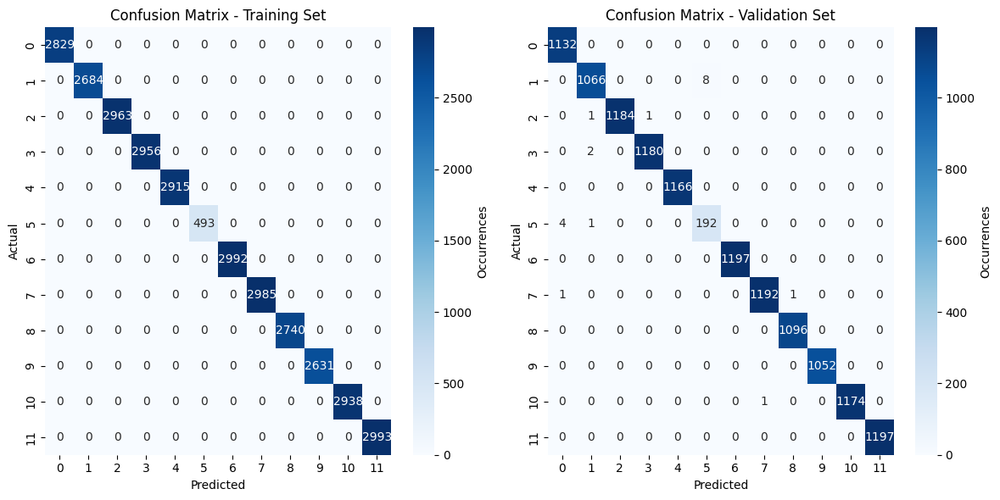

In [481]:
print("Classification Report - Training Set")
print(classification_report(y_train, y_train_rf))
print("\nClassification Report - Validation Set")
print(classification_report(y_val, y_val_rf))


fig, (train_ax, val_ax) = plt.subplots(1, 2, figsize=(12, 6))

# Confusion matrix for training set
training_confusion_matrix = confusion_matrix(y_train, y_train_rf)
sns.heatmap(
    training_confusion_matrix,
    annot=True,
    cmap="Blues",
    fmt="d",
    ax=train_ax,
    cbar_kws={"label": "Occurrences"},
)
train_ax.set_title("Confusion Matrix - Training Set")
train_ax.set_xlabel("Predicted")
train_ax.set_ylabel("Actual")

# Confusion matrix for validation set
validation_confusion_matrix = confusion_matrix(y_val, y_val_rf)
sns.heatmap(
    validation_confusion_matrix,
    annot=True,
    cmap="Blues",
    fmt="d",
    ax=val_ax,
    cbar_kws={"label": "Occurrences"},
)
val_ax.set_title("Confusion Matrix - Validation Set")
val_ax.set_xlabel("Predicted")
val_ax.set_ylabel("Actual")


plt.tight_layout()
plt.show()

## K-Nearest Neighbour 

In [482]:
KNN_KEYWORD = "K_NEAREST_NEIGHBORS"

In [483]:
knn_classifier = KNeighborsClassifier()
start = time.time()
knn_classifier.fit(X_train, y_train)
end = time.time()
train_time = end - start

start = time.time()
y_train_knn = knn_classifier.predict(X_train)
end = time.time()
predict_train_time = end - start

start = time.time()
y_val_knn = knn_classifier.predict(X_val)
end = time.time()
predict_val_time = end - start

time_recorder[KNN_KEYWORD] = {
    TRAIN_TIME: round(train_time, 4),
    PREDICT_TRAIN_TIME: round(predict_train_time, 4),
    PREDICT_VAL_TIME: round(predict_val_time, 4),
}

time_recorder

{'RANDOM_FOREST': {'TRAIN_TIME': 1.9487,
  'PREDICT_TRAIN_TIME': 0.206,
  'PREDICT_VAL_TIME': 0.0777},
 'K_NEAREST_NEIGHBORS': {'TRAIN_TIME': 0.0113,
  'PREDICT_TRAIN_TIME': 2.0518,
  'PREDICT_VAL_TIME': 0.8178}}

## Classification Report (Confusion matrix , Precision , F1-Score)

Classification Report - Training Set
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2829
           1       0.99      0.99      0.99      2684
           2       0.99      1.00      0.99      2963
           3       1.00      0.99      0.99      2956
           4       1.00      1.00      1.00      2915
           5       0.97      0.97      0.97       493
           6       1.00      1.00      1.00      2992
           7       1.00      1.00      1.00      2985
           8       0.99      0.99      0.99      2740
           9       0.99      0.99      0.99      2631
          10       1.00      1.00      1.00      2938
          11       1.00      1.00      1.00      2993

    accuracy                           0.99     32119
   macro avg       0.99      0.99      0.99     32119
weighted avg       0.99      0.99      0.99     32119


Classification Report - Validation Set
              precision    recall  f1-score   support

 

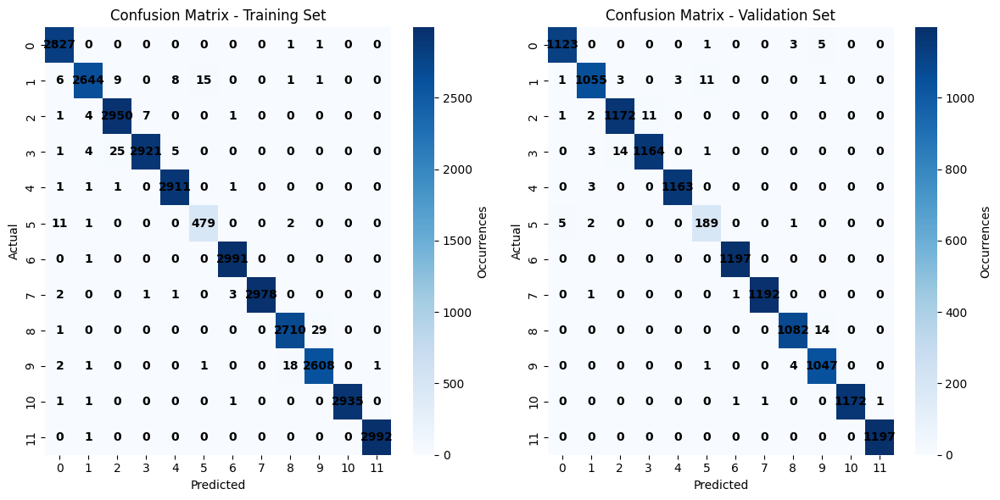

In [484]:
print("Classification Report - Training Set")
print(classification_report(y_train, y_train_knn))
print("\nClassification Report - Validation Set")
print(classification_report(y_val, y_val_knn))  


fig, (train_ax, val_ax) = plt.subplots(1, 2, figsize=(12, 6))

# Confusion matrix for training set
training_confusion_matrix = confusion_matrix(y_train, y_train_knn)
sns.heatmap(
    training_confusion_matrix,
    annot=True,
    cmap="Blues",
    fmt="d",
    ax=train_ax,
    cbar_kws={"label": "Occurrences"},
    annot_kws={"size": 10, "color": "black", "weight": "bold"},
)
train_ax.set_title("Confusion Matrix - Training Set", fontsize=12)
train_ax.set_xlabel("Predicted", fontsize=10)
train_ax.set_ylabel("Actual", fontsize=10)

# Confusion matrix for validation set
validation_confusion_matrix = confusion_matrix(y_val, y_val_knn)
sns.heatmap(
    validation_confusion_matrix,
    annot=True,
    cmap="Blues",
    fmt="d",
    ax=val_ax,
    cbar_kws={"label": "Occurrences"},
    annot_kws={"size": 10, "color": "black", "weight": "bold"},
)
val_ax.set_title("Confusion Matrix - Validation Set", fontsize=12)
val_ax.set_xlabel("Predicted", fontsize=10)
val_ax.set_ylabel("Actual", fontsize=10)


plt.tight_layout()
plt.show()

### SVM

In [485]:
SVM_KEYWORD = "SUPPORT_VECTOR_MACHINE"

In [486]:
svm_classifier = SVC()
start = time.time()
svm_classifier.fit(X_train, y_train)
end = time.time()
train_time = end - start

start = time.time()
y_train_svm = svm_classifier.predict(X_train)
end = time.time()
predict_train_time = end - start

start = time.time()
y_val_svm = svm_classifier.predict(X_val)
end = time.time()
predict_val_time = end - start

time_recorder[SVM_KEYWORD] = {
    TRAIN_TIME: round(train_time, 4),
    PREDICT_TRAIN_TIME: round(predict_train_time, 4),
    PREDICT_VAL_TIME: round(predict_val_time, 4),
}

time_recorder

{'RANDOM_FOREST': {'TRAIN_TIME': 1.9487,
  'PREDICT_TRAIN_TIME': 0.206,
  'PREDICT_VAL_TIME': 0.0777},
 'K_NEAREST_NEIGHBORS': {'TRAIN_TIME': 0.0113,
  'PREDICT_TRAIN_TIME': 2.0518,
  'PREDICT_VAL_TIME': 0.8178},
 'SUPPORT_VECTOR_MACHINE': {'TRAIN_TIME': 4.7381,
  'PREDICT_TRAIN_TIME': 10.476,
  'PREDICT_VAL_TIME': 4.0924}}

Training set
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2829
           1       1.00      0.99      1.00      2684
           2       0.97      1.00      0.99      2963
           3       1.00      0.97      0.98      2956
           4       1.00      1.00      1.00      2915
           5       0.98      0.99      0.99       493
           6       1.00      1.00      1.00      2992
           7       1.00      1.00      1.00      2985
           8       0.95      0.98      0.96      2740
           9       0.98      0.94      0.96      2631
          10       1.00      1.00      1.00      2938
          11       1.00      1.00      1.00      2993

    accuracy                           0.99     32119
   macro avg       0.99      0.99      0.99     32119
weighted avg       0.99      0.99      0.99     32119

Validation set
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      1

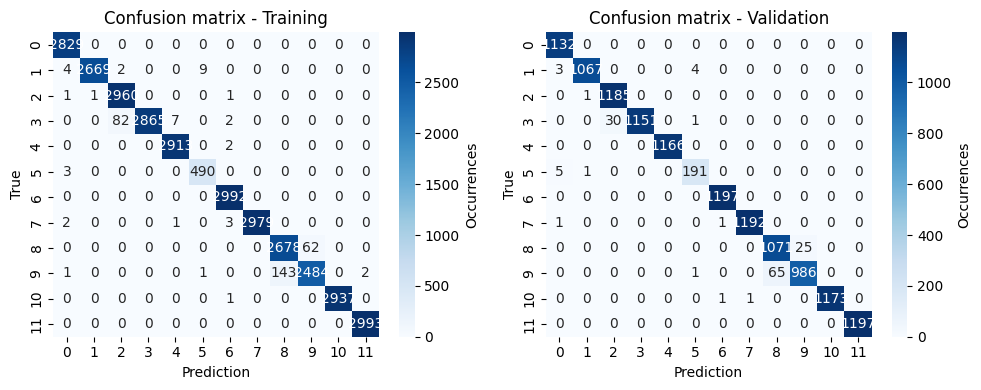

In [487]:
# classification report
print("Training set")
print(classification_report(y_train, y_train_svm))
print("Validation set")
print(classification_report(y_val, y_val_svm))

# get the confusion matrix & visualize the confusion matrix
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))

confusion_train = confusion_matrix(y_train, y_train_svm)
sns.heatmap(
    confusion_train,
    cmap="Blues",
    annot=True,
    ax=ax1,
    cbar_kws={"label": "Occurrences"},
    fmt="d",
)
ax1.set_xlabel("Prediction")
ax1.set_ylabel("True")
ax1.set_title("Confusion matrix - Training")

confusion_val = confusion_matrix(y_val, y_val_svm)
sns.heatmap(
    confusion_val,
    cmap="Blues",
    annot=True,
    ax=ax2,
    cbar_kws={"label": "Occurrences"},
    fmt="d",
)
ax2.set_xlabel("Prediction")
ax2.set_ylabel("True")
ax2.set_title("Confusion matrix - Validation")

plt.tight_layout()

#### No tuning comparison among methods

In [488]:
time_results_df  = pd.DataFrame(time_recorder).T 

time_results_df["MODEL"] = time_results_df.index.values     
time_results_df.reset_index(drop=True, inplace=True)
time_results_df

,TRAIN_TIME,PREDICT_TRAIN_TIME,PREDICT_VAL_TIME,MODEL
0,1.9487,0.2060,0.0777,RANDOM_FOREST
1,0.0113,2.0518,0.8178,K_NEAREST_NEIGHBORS
2,4.7381,10.4760,4.0924,SUPPORT_VECTOR_MACHINE


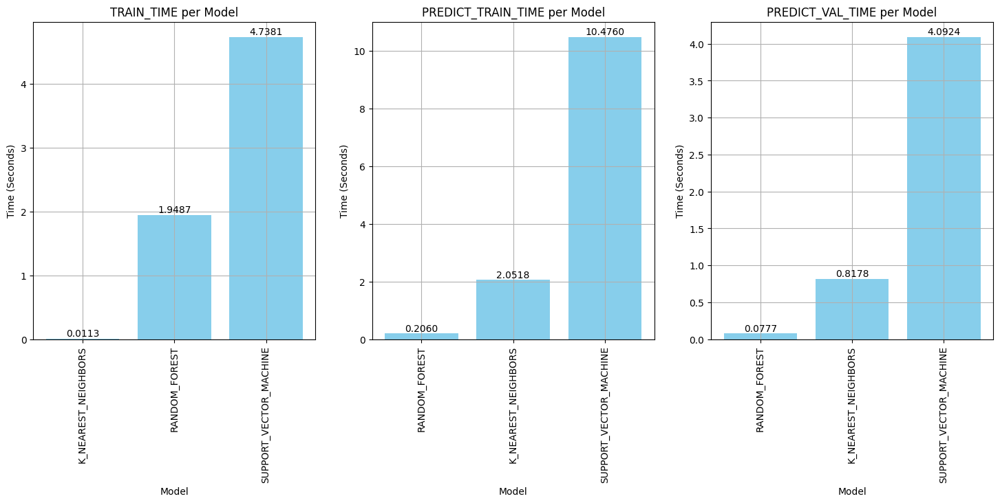

In [489]:
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

for i, col in enumerate(time_results_df.columns[0:3]):
    sorted_res = time_results_df.sort_values(by=col)
    bars = ax[i].bar(sorted_res["MODEL"], sorted_res[col], color="skyblue")

    for j, bar in enumerate(bars):
        h = bar.get_height()
        ax[i].text(
            bar.get_x() + bar.get_width() / 2.0,
            h,
            f"{h:.4f}",
            ha="center",
            va="bottom",
        )

    ax[i].set_title(f"{col} per Model")
    ax[i].set_xlabel("Model")
    ax[i].set_ylabel("Time (Seconds)")
    plt.setp(ax[i].get_xticklabels(), rotation=90)
    ax[i].grid()

#### Classification Report (Confusion Matrix, precision, Recall, F1-score)

#### Validation curve for RF

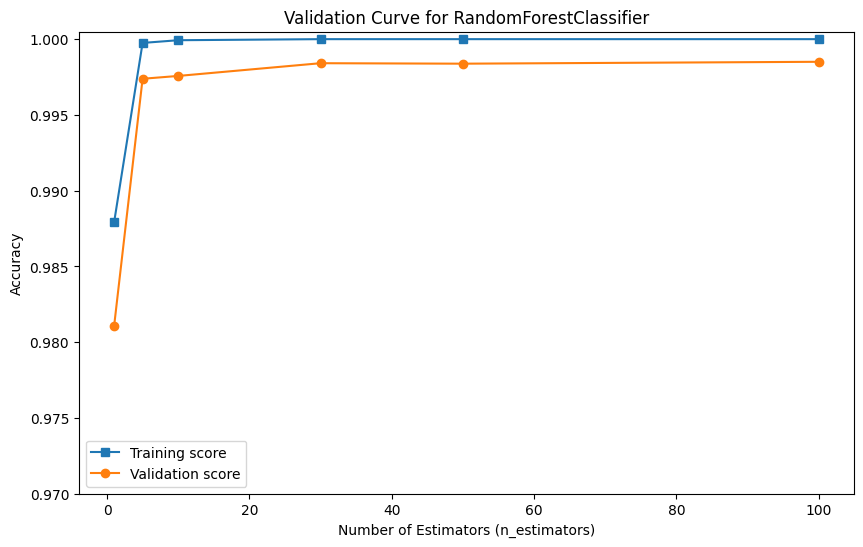

In [490]:
param_range = [1, 5, 10, 30, 50, 100]
train_scores, val_scores = validation_curve(
    RandomForestClassifier(),
    X_train,
    y_train,
    param_name="n_estimators",
    param_range=param_range,
    cv=5,
    scoring="accuracy",
    n_jobs=-1,
)

plt.figure(figsize=(10, 6))
plt.plot(param_range, np.mean(train_scores, axis=1), label="Training score", marker="s")
plt.plot(param_range, np.mean(val_scores, axis=1), label="Validation score", marker="o")
plt.xlabel("Number of Estimators (n_estimators)")
plt.ylabel("Accuracy")
plt.ylim(0.97, 1.0005)

plt.title("Validation Curve for RandomForestClassifier")
plt.legend()

##### Validation curve for KNN

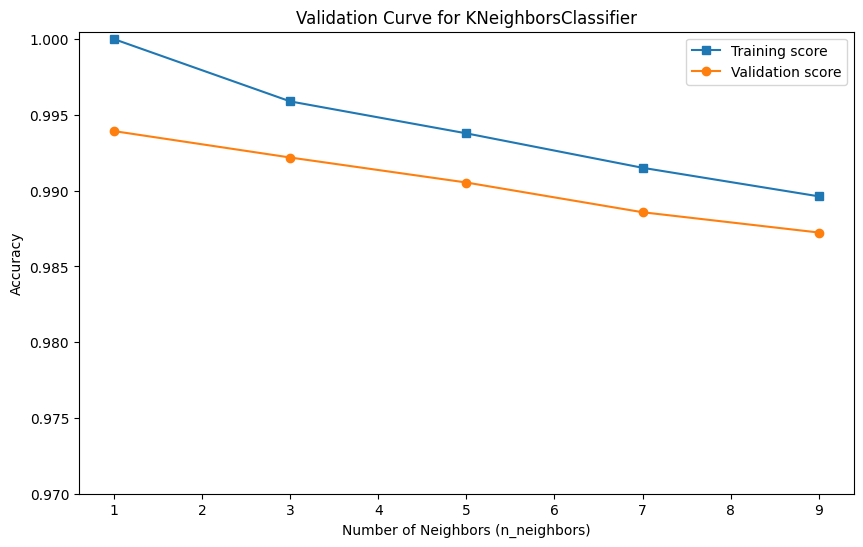

In [491]:
# Vary the number of neighbors (n_neighbors)
param_range = [1, 3, 5, 7, 9]
train_scores, test_scores = validation_curve(
    KNeighborsClassifier(),
    X_train,
    y_train,
    param_name="n_neighbors",
    param_range=param_range,
    cv=5,
    scoring="accuracy",
    n_jobs=-1,
)

plt.figure(figsize=(10, 6))
plt.plot(param_range, np.mean(train_scores, axis=1), label="Training score", marker="s")
plt.plot(
    param_range, np.mean(test_scores, axis=1), label="Validation score", marker="o"
)
plt.xlabel("Number of Neighbors (n_neighbors)")
plt.ylabel("Accuracy")
plt.ylim(0.97, 1.0005)

plt.title("Validation Curve for KNeighborsClassifier")
plt.legend()

#### Validation curve of SVC

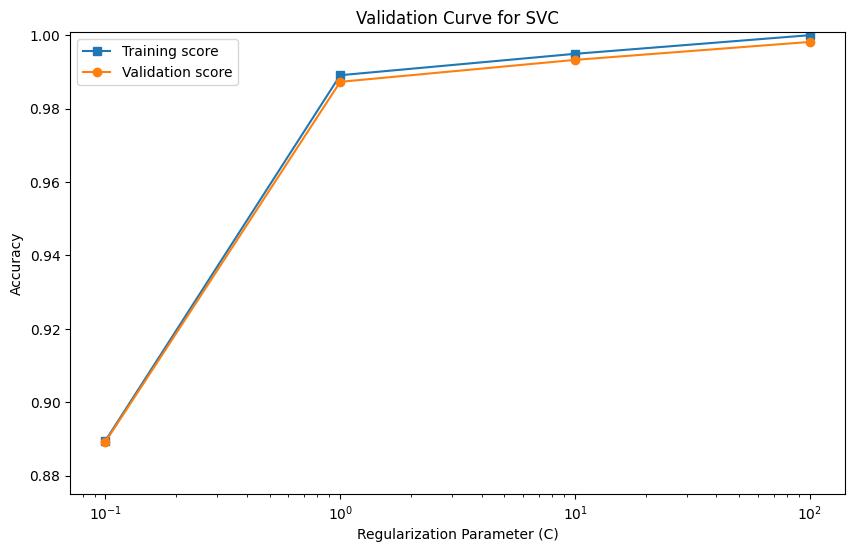

In [492]:
param_range = [0.1, 1, 10, 100]
train_scores, test_scores = validation_curve(
    SVC(),
    X_train,
    y_train,
    param_name="C",
    param_range=param_range,
    cv=5,
    scoring="accuracy",
    n_jobs=-1,
)

plt.figure(figsize=(10, 6))
plt.semilogx(
    param_range, np.mean(train_scores, axis=1), label="Training score", marker="s"
)
plt.semilogx(
    param_range, np.mean(test_scores, axis=1), label="Validation score", marker="o"
)
plt.xlabel("Regularization Parameter (C)")
plt.ylabel("Accuracy")
plt.ylim(0.875, 1.0008)

plt.title("Validation Curve for SVC")
plt.legend()
plt.show()

#### Hyper-Parameter tuning throw Randomized Cross Validator

In [493]:
random_state = 22

# Random Forest
rf_param_dist = {
    "n_estimators": randint(10, 100),
    "max_depth": [None, 10, 20, 30],
    "min_samples_split": randint(2, 20),
}
rf_model = RandomForestClassifier(random_state=random_state)

# SVC
svc_param_dist = {
    "C": uniform(0.1, 10),
    "kernel": ["linear", "rbf", "poly"],
    "gamma": ["scale", "auto"],
}
svc_model = SVC(random_state=random_state)

# KNN
knn_param_dist = {
    "n_neighbors": randint(1, 20),
    "weights": ["uniform", "distance"],
    "metric": ["euclidean", "manhattan"],
}
knn_model = KNeighborsClassifier()

# Perform RandomizedSearchCV for each model
models = {
    "RF": (rf_model, rf_param_dist),
    "SVC": (svc_model, svc_param_dist),
    "KNN": (knn_model, knn_param_dist),
}

best_param_score = {}

for model_name, (model, param_dist) in models.items():
    random_search = RandomizedSearchCV(
        model,
        param_distributions=param_dist,
        n_iter=15,
        cv=3,
        random_state=random_state,
        n_jobs=-1,
    )
    random_search.fit(X_train, y_train)
    print(f"Best parameters for {model_name}:")
    print(random_search.best_params_)
    print(f"Best score for {model_name}:")
    print(random_search.best_score_)
    print("\n" + "=" * 40 + "\n")

    best_param_score[model_name] = {
        "Best Parameters": random_search.best_params_,
        "Best Score": random_search.best_score_,
    }

Best parameters for RF:
{'max_depth': None, 'min_samples_split': 6, 'n_estimators': 28}
Best score for RF:
0.9982876082244426


Best parameters for SVC:
{'C': np.float64(7.551002960588356), 'gamma': 'auto', 'kernel': 'linear'}
Best score for SVC:
0.9933995347651937


Best parameters for KNN:
{'metric': 'manhattan', 'n_neighbors': 3, 'weights': 'distance'}
Best score for KNN:
0.9943024436142075




In [494]:
best_model_tested = max(
    best_param_score, key=lambda x: best_param_score[x]["Best Score"]
)
print(
    f"Best model tested: {best_model_tested} with accuracy score of { round(best_param_score[best_model_tested]['Best Score'], 4)}"
)

Best model tested: RF with accuracy score of 0.9983


In [495]:
time_recorder = {}      

In [496]:
tuned_rf_classification = RandomForestClassifier(
    **best_param_score["RF"]["Best Parameters"]
)

start = time.time()
tuned_rf_classification.fit(X_train, y_train)
end = time.time()

train_time = end - start

start = time.time()
y_train_rf = tuned_rf_classification.predict(X_train)
end = time.time()
predict_train_time = end - start

start = time.time()
y_val_rf = tuned_rf_classification.predict(X_val)
end = time.time()

predict_val_time = end - start

time_recorder[RF_KEYWORD] = {
    TRAIN_TIME: round(train_time, 4),
    PREDICT_TRAIN_TIME: round(predict_train_time, 4),
    PREDICT_VAL_TIME: round(predict_val_time, 4),
}

In [497]:
tuned_knn_classification = KNeighborsClassifier(**best_param_score["KNN"]["Best Parameters"])               

start = time.time() 
tuned_knn_classification.fit(X_train, y_train)
end = time.time()
train_time = end - start

start = time.time()
y_train_knn = tuned_knn_classification.predict(X_train)
end = time.time()   
predict_train_time = end - start    

start = time.time() 
y_val_knn = tuned_knn_classification.predict(X_val)
end = time.time()
predict_val_time = end - start  

time_recorder[KNN_KEYWORD] = {  
    TRAIN_TIME: round(train_time, 4),
    PREDICT_TRAIN_TIME: round(predict_train_time, 4),
    PREDICT_VAL_TIME: round(predict_val_time, 4)   
}       

In [498]:
tuned_svm_classification = SVC(**best_param_score["SVC"]["Best Parameters"])

start = time.time()
tuned_svm_classification.fit(X_train, y_train)
end = time.time()
train_time = end - start

start = time.time()
y_train_svm = tuned_svm_classification.predict(X_train)
end = time.time()
predict_train_time = end - start

start = time.time()
y_val_svm = tuned_svm_classification.predict(X_val)
end = time.time()
predict_val_time = end - start

time_recorder[SVM_KEYWORD] = {
    TRAIN_TIME: round(train_time, 4),
    PREDICT_TRAIN_TIME: round(predict_train_time, 4),
    PREDICT_VAL_TIME: round(predict_val_time, 4),
}

In [499]:
time_recorder_df = pd.DataFrame(time_recorder).T
time_recorder_df["MODEL"] = time_recorder_df.index.values
time_recorder_df.reset_index(drop=True, inplace=True)
time_recorder_df

,TRAIN_TIME,PREDICT_TRAIN_TIME,PREDICT_VAL_TIME,MODEL
0,0.4950,0.0655,0.0215,RANDOM_FOREST
1,0.0081,4.3586,1.8093,K_NEAREST_NEIGHBORS
2,8.6044,1.0701,0.4283,SUPPORT_VECTOR_MACHINE


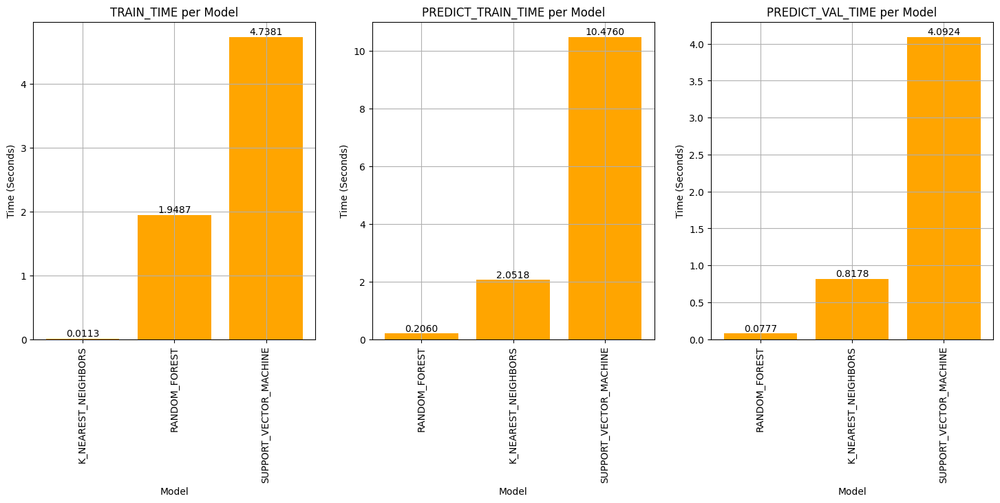

In [500]:
# plotted time results for each model related to training and prediction after tuning
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

for i, col in enumerate(time_results_df.columns[0:3]):
    sorted_res = time_results_df.sort_values(by=col)
    bars = ax[i].bar(sorted_res["MODEL"], sorted_res[col], color="orange")

    for j, bar in enumerate(bars):
        h = bar.get_height()
        ax[i].text(
            bar.get_x() + bar.get_width() / 2.0,
            h,
            f"{h:.4f}",
            ha="center",
            va="bottom",
        )

    ax[i].set_title(f"{col} per Model")
    ax[i].set_xlabel("Model")
    ax[i].set_ylabel("Time (Seconds)")
    plt.setp(ax[i].get_xticklabels(), rotation=90)
    ax[i].grid()

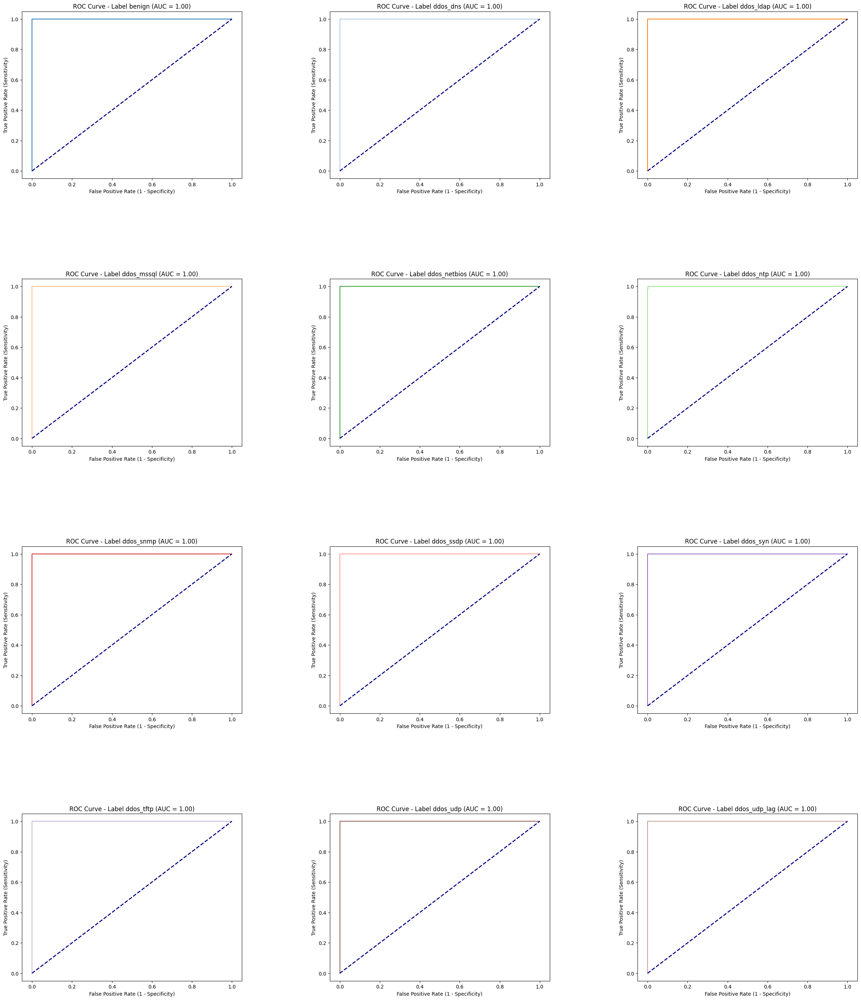

In [501]:
# only labels with unique intLabel
unique_labels_df = (
    df_label[~df_label["label"].duplicated(keep="first")]
    .sort_values(by="intLabel", ascending=True)
    .reset_index(drop=True)
)

classes = unique_labels_df["intLabel"].values

colors = plt.cm.tab20.colors[: len(classes)]

r, c = len(classes) // 3, 3

# roc curve for each label in separated subplots
fig, ax = plt.subplots(
    r, c, figsize=(30, 35), gridspec_kw={"wspace": 0.4, "hspace": 0.6}
)

for i in classes:
    row, col = i // c, i % c
    y_true = (y_test == i).astype(int)
    y_score = tuned_rf_classification.predict_proba(X_test)[:, i]
    fpr, tpr, _ = roc_curve(y_true, y_score)
    roc_auc = auc(fpr, tpr)

    ax[row, col].plot(fpr, tpr, color=colors[i])
    ax[row, col].plot([0, 1], [0, 1], color="navy", lw=2, linestyle="--")
    lb = unique_labels_df[unique_labels_df["intLabel"] == i]["label"].values[0]
    ax[row, col].set_title(f"ROC Curve - Label {lb} (AUC = {roc_auc:.2f})")
    ax[row, col].set_xlabel("False Positive Rate (1 - Specificity)")
    ax[row, col].set_ylabel("True Positive Rate (Sensitivity)")

# plt.tight_layout()
plt.show()

#### Feature importance for Random Forest with tuned parameters 

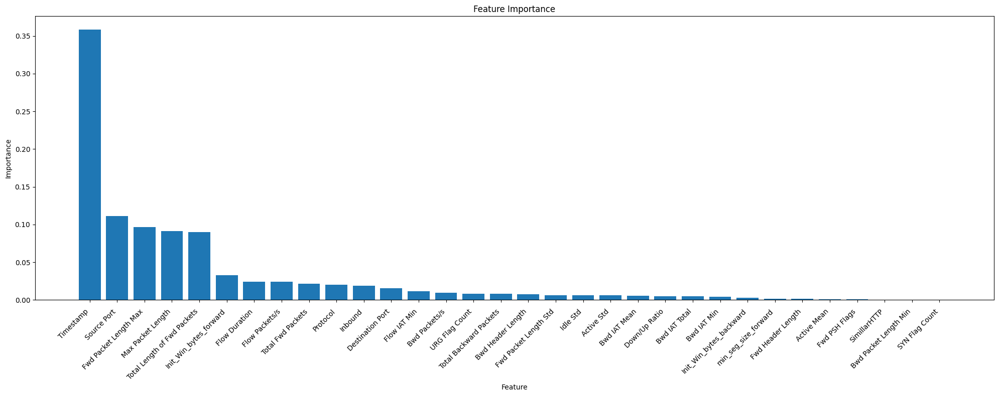

In [502]:
# Get the feature importances
feature_importances = tuned_rf_classification.feature_importances_

# Sort the feature importances in descending order
feature_importances_indexes = np.argsort(feature_importances)[::-1]
feature_importances = feature_importances[feature_importances_indexes]

feature_names = new_ddos_df.columns[feature_importances_indexes]


plt.figure(figsize=(20, 8))
plt.bar(range(X_train.shape[1]), feature_importances)
plt.xticks(range(X_train.shape[1]), feature_names, rotation=45, ha="right")
plt.tick_params(axis="x", which="major", pad=8)

plt.xlabel("Feature")
plt.ylabel("Importance")
plt.title("Feature Importance")
plt.tight_layout()

### Confusion matrix of each class(label) for Random Forest model

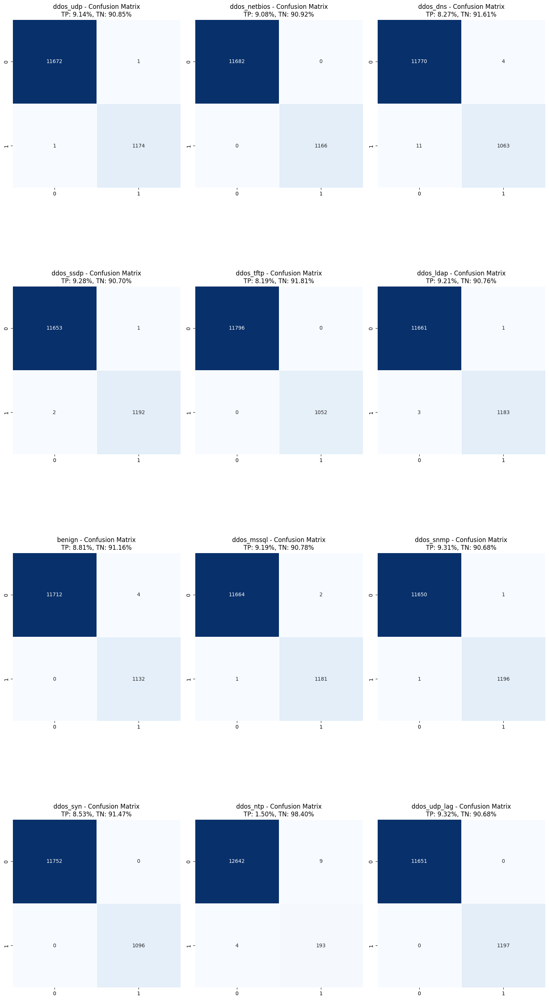

In [503]:
classes = y.unique()
# sns.set(style="whitegrid")

# Plot confusion matrix for each class on a separate line
plt.figure(figsize=(15, 30))

r, c = len(classes) // 3, 3

for i, class_name in enumerate(classes, 1):
    row, col = i // c, i % c
    plt.subplot(r, c, i)

    # Create a binary confusion matrix for the current class
    y_true_binary = (y_val == class_name).astype(int)
    y_pred_binary = (y_val_rf == class_name).astype(int)

    cm = confusion_matrix(y_true_binary, y_pred_binary)

    # Calculate TP, TN, FP, FN
    tp = cm[1, 1] if cm.shape == (2, 2) else 0
    tn = cm[0, 0] if cm.shape == (2, 2) else cm[0, 0] + cm[1, 1]
    fp = cm[0, 1] if cm.shape == (2, 2) else 0
    fn = cm[1, 0] if cm.shape == (2, 2) else 0

    # Calculate percentage of TP and TN
    total_samples = len(y_val)
    tp_percentage = (tp / total_samples) * 100
    tn_percentage = (tn / total_samples) * 100

    sns.heatmap(
        cm, annot=True, fmt="d", cmap="Blues", cbar=False, square=True, linewidths=0.5
    )
    lb = df_label[df_label["intLabel"] == class_name]["label"].values[0]
    plt.title(
        f"{lb} - Confusion Matrix\nTP: {tp_percentage:.2f}%, TN: {tn_percentage:.2f}%",
        fontsize=12,
    )

plt.tight_layout()

#### Test Data classification report(RF)

In [504]:
performance_recorder = {}   

#### regenerate the model with the best parameters
tuned_rf_classification = RandomForestClassifier(
    **best_param_score["RF"]["Best Parameters"]
)

start = time.time() 
tuned_rf_classification.fit(X, y)
end = time.time()   
train_time = end - start    

start = time.time() 
y_test_rf = tuned_rf_classification.predict(X_test)
end = time.time()   
predict_test_time = end - start 

performance_recorder[RF_KEYWORD] = {    
    "TRAIN_TIME": round(train_time, 4),
    "PREDICT_TEST_TIME": round(predict_test_time, 4), 
    "ACCURACY": round(accuracy_score(y_test, y_test_rf), 4) 
}

print("Classification Report - Test Set")

print(classification_report(y_test, y_test_rf))

Classification Report - Test Set
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1697
           1       1.00      1.00      1.00      1611
           2       1.00      1.00      1.00      1779
           3       1.00      1.00      1.00      1773
           4       1.00      1.00      1.00      1749
           5       0.98      1.00      0.99       296
           6       1.00      1.00      1.00      1795
           7       1.00      1.00      1.00      1791
           8       1.00      1.00      1.00      1644
           9       1.00      1.00      1.00      1578
          10       1.00      1.00      1.00      1763
          11       1.00      1.00      1.00      1796

    accuracy                           1.00     19272
   macro avg       1.00      1.00      1.00     19272
weighted avg       1.00      1.00      1.00     19272



Text(0.5, 1.0, 'Confusion matrix')

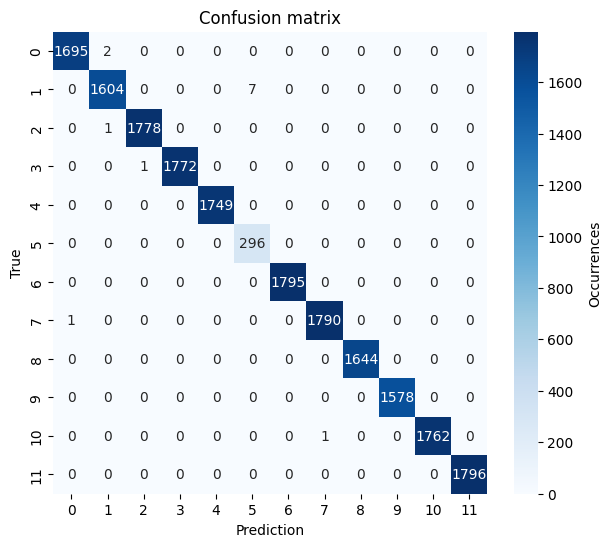

In [505]:
# visualize the confusion matrix
plt.figure(figsize=(7, 6))
sns.heatmap(
    confusion_matrix(y_test, y_test_rf),
    cmap="Blues",
    annot=True,
    cbar_kws={"label": "Occurrences"},
    fmt="d",
)

plt.xlabel("Prediction")
plt.ylabel("True")
plt.title("Confusion matrix")

#### Try RF using PCA

In [506]:
y = df_label["intLabel"]

new_pca_ddos_df = pca_ddos_df.iloc[:, 0:pca_ddos_df.shape[1] -1 ].copy()  
print(new_pca_ddos_df.shape)    


# scale = StandardScaler()    
# scaled_data = scale.fit_transform(new_pca_ddos_df)  


X, X_test, y, y_test = train_test_split(
    new_pca_ddos_df, y, stratify=y, train_size=0.7, random_state=15
)


X_train, X_val, y_train, y_val = train_test_split(
    X, y, stratify=y, train_size=0.5 / 0.7, random_state=15
)

(64239, 12)


#### Tuning for PCA dataset

In [507]:
rf_param_dist = {
    "n_estimators": randint(10, 100),
    "max_depth": [None, 10, 20, 30],
    "min_samples_split": randint(2, 20),
}
rf_model = RandomForestClassifier(random_state=random_state)

pca_rf_classification = RandomizedSearchCV(
        rf_model,
        param_distributions=rf_param_dist,
        n_iter=15,
        cv=3,
        random_state=random_state,
        n_jobs=-1,
    )
pca_rf_classification.fit(X_train, y_train) 

print("Best parameters for RF:")    
print(pca_rf_classification.best_params_)   
print("Best score for RF:") 
print(pca_rf_classification.best_score_)

Best parameters for RF:
{'max_depth': None, 'min_samples_split': 4, 'n_estimators': 39}
Best score for RF:
0.9900681945841194


In [508]:

PCA_RF_KEYWORD = "RANDOM_FOREST_PCA"   

tuned_pca_rf_classification = RandomForestClassifier(
    **pca_rf_classification.best_params_
)   

start = time.time() 
tuned_pca_rf_classification.fit(X, y)
end = time.time()   
train_time = end - start    

start = time.time()
y_test_pca_rf = tuned_pca_rf_classification.predict(X_test) 
end = time.time()
predict_train_time = end - start    

performance_recorder[PCA_RF_KEYWORD] = {    
    "TRAIN_TIME": round(train_time, 4),
    "PREDICT_TEST_TIME": round(predict_train_time, 4), 
    "ACCURACY": round(accuracy_score(y_test, y_test_pca_rf), 4) 
}   

print("Classification Report - Test Set")
print(classification_report(y_test, y_test_pca_rf)) 


Classification Report - Test Set
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      1697
           1       0.99      0.98      0.98      1611
           2       0.99      0.99      0.99      1779
           3       0.99      0.99      0.99      1773
           4       0.99      1.00      0.99      1749
           5       0.97      0.99      0.98       296
           6       1.00      1.00      1.00      1795
           7       1.00      1.00      1.00      1791
           8       1.00      0.99      0.99      1644
           9       0.99      0.99      0.99      1578
          10       1.00      1.00      1.00      1763
          11       1.00      1.00      1.00      1796

    accuracy                           0.99     19272
   macro avg       0.99      0.99      0.99     19272
weighted avg       0.99      0.99      0.99     19272



In [509]:
performance_recorder_df = pd.DataFrame(performance_recorder).T  

performance_recorder_df["MODEL"] = performance_recorder_df.index.values     
performance_recorder_df.reset_index(drop=True, inplace=True)    
performance_recorder_df 

,TRAIN_TIME,PREDICT_TEST_TIME,ACCURACY,MODEL
0,0.7287,0.0275,0.9993,RANDOM_FOREST
1,4.7311,0.0503,0.9940,RANDOM_FOREST_PCA


#### Feature importance for PCS

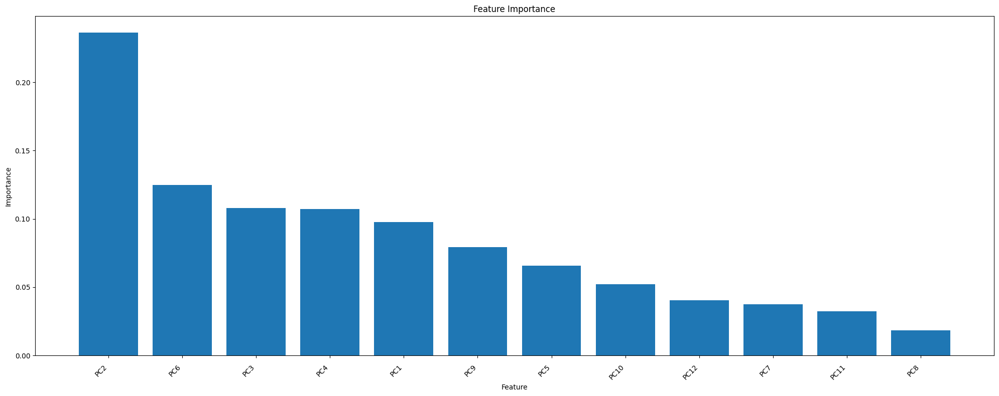

In [510]:
# Get the feature importances
feature_importances = tuned_pca_rf_classification.feature_importances_

# Sort the feature importances in descending order
feature_importances_indexes = np.argsort(feature_importances)[::-1]
feature_importances = feature_importances[feature_importances_indexes]

feature_names = new_pca_ddos_df.columns[feature_importances_indexes]


plt.figure(figsize=(20, 8))
plt.bar(range(X_train.shape[1]), feature_importances)
plt.xticks(range(X_train.shape[1]), feature_names, rotation=45, ha="right")
plt.tick_params(axis="x", which="major", pad=8)

plt.xlabel("Feature")
plt.ylabel("Importance")
plt.title("Feature Importance")
plt.tight_layout()

### Section 3

In [511]:
#used to reproduce the same result  
random_state = 33   

cluster_new_ddos_df = new_ddos_df.copy()    

display(cluster_new_ddos_df)    

cluster_features = cluster_new_ddos_df.columns    

display(df_label)

y = df_label["label"]    

y_int = df_label["intLabel"]        

,Source Port,Destination Port,Protocol,Timestamp,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Fwd Packet Length Max,Fwd Packet Length Std,...,URG Flag Count,Down/Up Ratio,Init_Win_bytes_forward,Init_Win_bytes_backward,min_seg_size_forward,Active Mean,Active Std,Idle Std,SimillarHTTP,Inbound
0,-0.996890,1.463534,0.560382,-0.981207,-0.227684,0.169121,-0.051748,1.754276,-0.297075,-0.172277,...,-0.224105,-0.265523,-0.266314,-0.102881,0.202023,-0.044128,-0.034259,-0.165955,-0.086584,0.295752
1,-0.996890,1.463534,0.560382,-0.981205,-0.228947,-0.036372,-0.051748,-0.283738,-0.297075,-0.172277,...,-0.224105,-0.265523,-0.266314,-0.102881,0.202023,-0.044128,-0.034259,-0.165955,-0.086584,-3.381206
2,-0.996890,0.770389,0.560382,-0.981198,-0.226789,0.391920,-0.051748,3.963912,-0.297075,-0.172277,...,-0.224105,-0.265523,-0.266314,-0.102881,0.202023,-0.044128,-0.034259,-0.165955,-0.086584,0.295752
3,-0.996890,-0.924976,0.560382,-0.981189,-0.226799,0.391920,-0.051748,3.963912,-0.297075,-0.172277,...,-0.224105,-0.265523,-0.266314,-0.102881,0.202023,-0.044128,-0.034259,-0.165955,-0.086584,0.295752
4,-0.996890,-0.139438,0.560382,-0.981176,-0.227524,0.391920,-0.051748,3.963912,-0.297075,-0.172277,...,-0.224105,-0.265523,-0.266314,-0.102881,0.202023,-0.044128,-0.034259,-0.165955,-0.086584,0.295752
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64234,0.540571,1.589149,0.560382,0.942099,-0.228947,-0.036372,-0.051748,-0.290077,-0.408056,-0.172277,...,-0.224105,-0.265523,-0.266314,-0.102881,0.202023,-0.044128,-0.034259,-0.165955,-0.086584,0.295752
64235,1.350236,-0.577568,0.560382,0.942099,-0.219513,-0.027720,-0.051748,-0.224841,-0.377323,0.521580,...,-0.224105,-0.265523,-0.266314,-0.102881,0.202023,-0.044128,-0.034259,-0.165955,-0.086584,0.295752
64236,0.843239,1.670387,0.560382,0.942099,-0.228947,-0.036372,-0.051748,-0.290077,-0.408056,-0.172277,...,-0.224105,-0.265523,-0.266314,-0.102881,0.202023,-0.044128,-0.034259,-0.165955,-0.086584,0.295752
64237,1.433360,-0.996433,0.560382,0.942099,-0.224104,-0.032046,-0.051748,-0.256532,-0.384152,0.501315,...,-0.224105,-0.265523,-0.266314,-0.102881,0.202023,-0.044128,-0.034259,-0.165955,-0.086584,0.295752


,label,intLabel
0,ddos_dns,1
1,ddos_dns,1
2,ddos_dns,1
3,ddos_dns,1
4,ddos_dns,1
...,...,...
64234,ddos_udp_lag,11
64235,ddos_udp_lag,11
64236,ddos_udp_lag,11
64237,ddos_udp_lag,11


#### PCAs  distribution plot for (PC1, PC2)




In [512]:
pca = PCA(n_components=2)      
pca_data = pca.fit_transform(cluster_new_ddos_df) 

pca_df = pd.DataFrame(data=pca_data, columns=["PC1", "PC2"])        

pca_df


,PC1,PC2
0,0.767441,-0.629539
1,-0.346203,-1.122489
2,0.751729,-1.024041
3,0.451114,-1.236055
4,0.591097,-1.138002
...,...,...
64234,1.164697,1.014167
64235,-0.029178,0.806229
64236,1.113604,1.099688
64237,-0.119614,0.783723


Text(0.5, 1.0, 'PCA Scatter Plot')

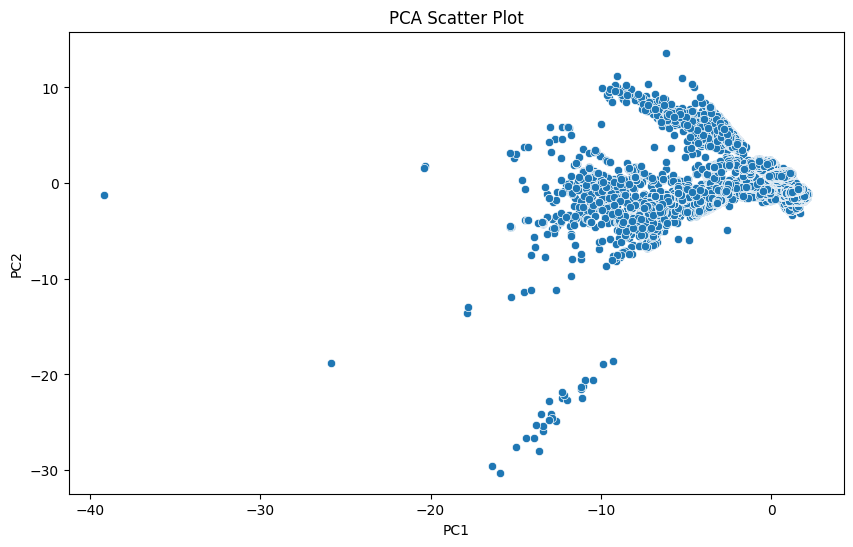

In [513]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x="PC1", y="PC2", data=pca_df)  
plt.title("PCA Scatter Plot")   


#### Selection of 2 clustering models: 
- K-Means clustering (it is hard clustering)
- Gaussian Mixture Models (GMM) (it is soft clustering)
 

#### K-Means

##### Initialized K-Means with nr clusters as nr of labels and calculation of metrics 

In [514]:
# KMeans Clustering with number of clusters equal to the number of unique labels
nr_init = 10    

km = KMeans(n_clusters=len(unique_labels), random_state=random_state)   

km.fit(cluster_new_ddos_df)

km_clusters = km.labels_
km_centroids = km.cluster_centers_

unique_clusters, count = np.unique(km_clusters, return_counts=True)

clusters_df = pd.DataFrame(data={"Cluster": unique_clusters, "Count": count})

display(clusters_df)

silhouette = silhouette_score(cluster_new_ddos_df, km_clusters)
ri = rand_score(y_int, km_clusters)
ari = adjusted_rand_score(y_int, km_clusters)
print(f"Clustering Error: {round(km.inertia_, 2)}")
print(f"Silhouette Score: {round(silhouette, 2)}")
print(f"Rand Index: {round(ri, 2)}")
print(f"Adjusted Rand Index: {round(ari, 2)}")

,Cluster,Count
0,0,18872
1,1,10636
2,2,619
3,3,557
4,4,23847
5,5,546
6,6,645
7,7,3527
8,8,547
9,9,2152


Clustering Error: 1043097.74
Silhouette Score: 0.33
Rand Index: 0.81
Adjusted Rand Index: 0.36


##### Number of clusters analysis  

In [515]:
# Function to perform KMeans clustering used in parallel    
def kmeans_clustering(nr_clusters, data):
    km = KMeans(n_clusters=nr_clusters, random_state=random_state)
    km.fit(data)

    km_clusters = km.labels_

    silhouette = silhouette_score(data, km_clusters)
    ri = rand_score(y_int, km_clusters)
    ari = adjusted_rand_score(y_int, km_clusters)

    return {
        "silhouette": silhouette,
        "rand_index": ri,
        "adjusted_rand_index": ari,
        "cluster": nr_clusters, 
        "error": km.inertia_ 
    }

# Perform KMeans clustering for different number of clusters in parallel    
parallel_jobs = (
    delayed(kmeans_clustering)(i, cluster_new_ddos_df)
    for i in range(2, 14)
)
# Perform the parallel jobs with 4 workers
results = Parallel(n_jobs=6)(parallel_jobs)

metrics_records =  pd.DataFrame(results) 
metrics_records = metrics_records.sort_values(by="cluster").reset_index(drop=True)  

display(metrics_records) 

,silhouette,rand_index,adjusted_rand_index,cluster,error
0,0.699771,0.138027,0.003276,2,1.881459e+06
1,0.690819,0.140166,0.003035,3,1.794305e+06
2,0.217228,0.578820,0.124516,4,1.670187e+06
3,0.309358,0.588065,0.159681,5,1.542243e+06
4,0.313446,0.587985,0.159211,6,1.482258e+06
5,0.239101,0.724744,0.250171,7,1.391600e+06
6,0.251771,0.755343,0.295293,8,1.373318e+06
7,0.265627,0.758060,0.297969,9,1.301826e+06
8,0.311099,0.810040,0.371142,10,1.169598e+06
9,0.314217,0.809995,0.370878,11,1.104454e+06


In [516]:
def elbow_cal(row): 
    if row.name == 0:   
        return row["error"]
    else:
        return metrics_records.iloc[row.name - 1]["error"] - row["error"]   

  
metrics_records["elbow"] = metrics_records.apply(lambda row : elbow_cal(row) , axis=1)
display(metrics_records)

best_silhouette = metrics_records["silhouette"].max()
best_cls = metrics_records[metrics_records["silhouette"] == best_silhouette]["cluster"].values[0]   


,silhouette,rand_index,adjusted_rand_index,cluster,error,elbow
0,0.699771,0.138027,0.003276,2,1.881459e+06,1.881459e+06
1,0.690819,0.140166,0.003035,3,1.794305e+06,8.715325e+04
2,0.217228,0.578820,0.124516,4,1.670187e+06,1.241180e+05
3,0.309358,0.588065,0.159681,5,1.542243e+06,1.279443e+05
4,0.313446,0.587985,0.159211,6,1.482258e+06,5.998512e+04
5,0.239101,0.724744,0.250171,7,1.391600e+06,9.065797e+04
6,0.251771,0.755343,0.295293,8,1.373318e+06,1.828160e+04
7,0.265627,0.758060,0.297969,9,1.301826e+06,7.149231e+04
8,0.311099,0.810040,0.371142,10,1.169598e+06,1.322286e+05
9,0.314217,0.809995,0.370878,11,1.104454e+06,6.514371e+04


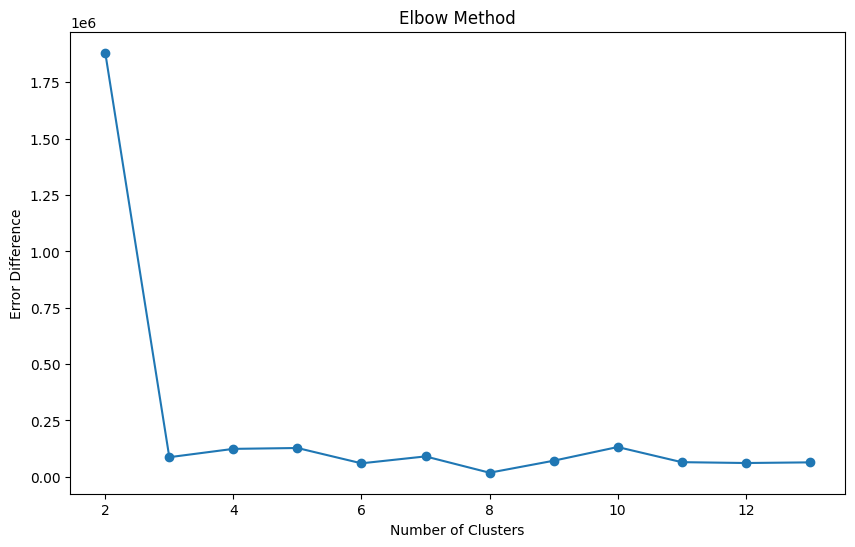

In [517]:
# Plot the Elbow (Error Difference) Method     
plt.figure(figsize=(10, 6)) 
plt.plot(metrics_records["cluster"], metrics_records["elbow"], marker='o')  
plt.title("Elbow Method")   
plt.xlabel("Number of Clusters")    
plt.ylabel("Error Difference")   
  
plt.show()

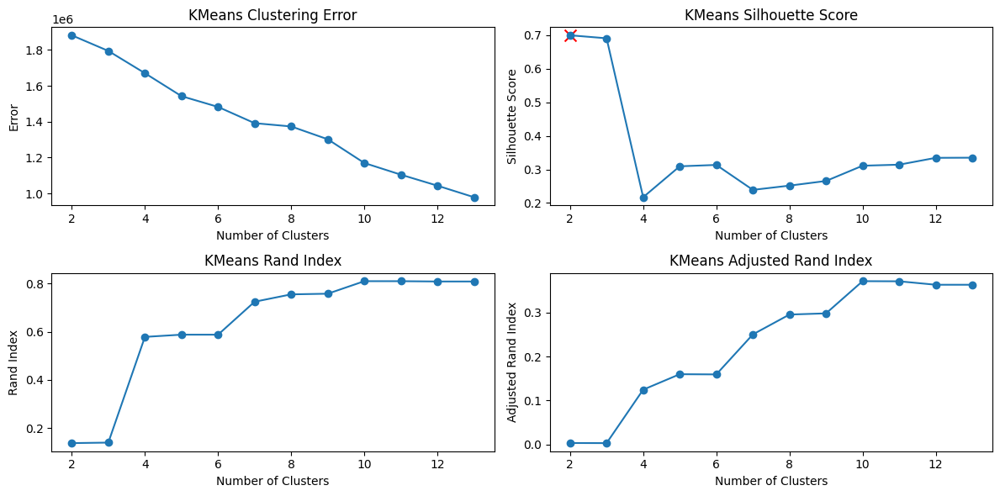

In [518]:
r, c = 2, 2 

# Plot the metrics for different number of clusters 
fig, ax = plt.subplots(r, c, figsize=(12, 6))      

ax[0, 0].plot(metrics_records["cluster"], metrics_records["error"], marker='o')    
ax[0, 0].set_title("KMeans Clustering Error")   
ax[0, 0].set_xlabel("Number of Clusters")   
ax[0, 0].set_ylabel("Error")    

ax[0, 1].plot(metrics_records["cluster"], metrics_records["silhouette"], marker='o')  
ax[0, 1].scatter(best_cls, best_silhouette, color='red', marker='x', s=100)    
ax[0, 1].set_title("KMeans Silhouette Score")   
ax[0, 1].set_xlabel("Number of Clusters")
ax[0, 1].set_ylabel("Silhouette Score")

ax[1, 0].plot(metrics_records["cluster"], metrics_records["rand_index"], marker='o')    
ax[1, 0].set_title("KMeans Rand Index")
ax[1, 0].set_xlabel("Number of Clusters")
ax[1, 0].set_ylabel("Rand Index")

ax[1, 1].plot(metrics_records["cluster"], metrics_records["adjusted_rand_index"], marker='o')
ax[1, 1].set_title("KMeans Adjusted Rand Index")
ax[1, 1].set_xlabel("Number of Clusters")
ax[1, 1].set_ylabel("Adjusted Rand Index")

plt.tight_layout()
plt.show()

##### Distribution of clusters by means of 2PC and comparison with GT labels

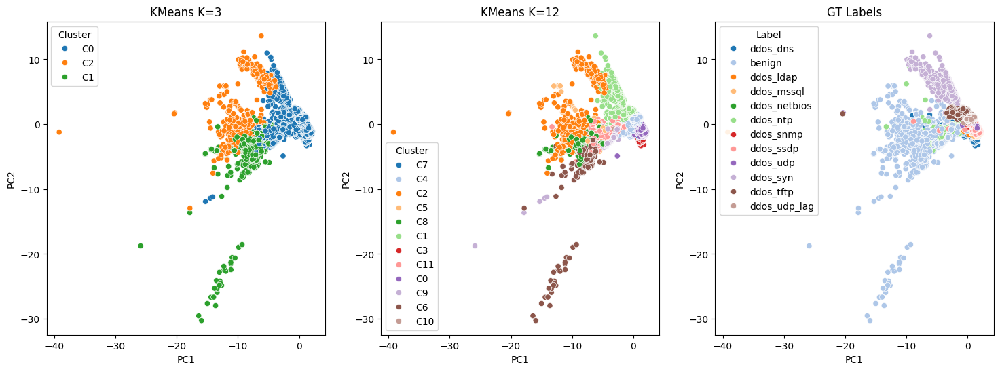

In [519]:
best_n = 3 #according to the silhouette score and inertia elbow method  

initial_n = 12  

# KMeans Clustering with best number of clusters    
km3 = KMeans(n_clusters=best_n, random_state=random_state)       
cl_labels3 = km3.fit_predict(cluster_new_ddos_df)        
pca_df['cl_label3'] = [f"C{i}" for i in cl_labels3]

# KMeans Clustering with initial number of clusters 
km12 = KMeans(n_clusters=initial_n, random_state=random_state)  
cl_labels12 = km12.fit_predict(cluster_new_ddos_df) 
pca_df['cl_label12'] = [f"C{i}" for i in cl_labels12]     

pca_df['label'] = y.values  

fig, axs = plt.subplots(1, 3, figsize=(18, 6))  

sns.scatterplot(x="PC1", y="PC2", data=pca_df, hue="cl_label3", palette="tab10",  ax=axs[0])        
axs[0].set_title("KMeans K=3")  

sns.scatterplot(x="PC1", y="PC2", data=pca_df, hue="cl_label12", palette="tab20", ax=axs[1])
axs[1].set_title("KMeans K=12") 


sns.scatterplot(x="PC1", y="PC2", data=pca_df, hue="label", palette="tab20", ax=axs[2])
axs[2].set_title("GT Labels")

for ax in axs[:2]: 
    ax.legend(title="Cluster")  

axs[2].legend(title="Label")
plt.show()



##### Flow distribution per clusters

{np.int32(0): np.int64(62280), np.int32(1): np.int64(1245), np.int32(2): np.int64(714)}
{np.int32(0): np.int64(18872), np.int32(1): np.int64(10636), np.int32(2): np.int64(619), np.int32(3): np.int64(557), np.int32(4): np.int64(23847), np.int32(5): np.int64(546), np.int32(6): np.int64(645), np.int32(7): np.int64(3527), np.int32(8): np.int64(547), np.int32(9): np.int64(2152), np.int32(10): np.int64(38), np.int32(11): np.int64(2253)}


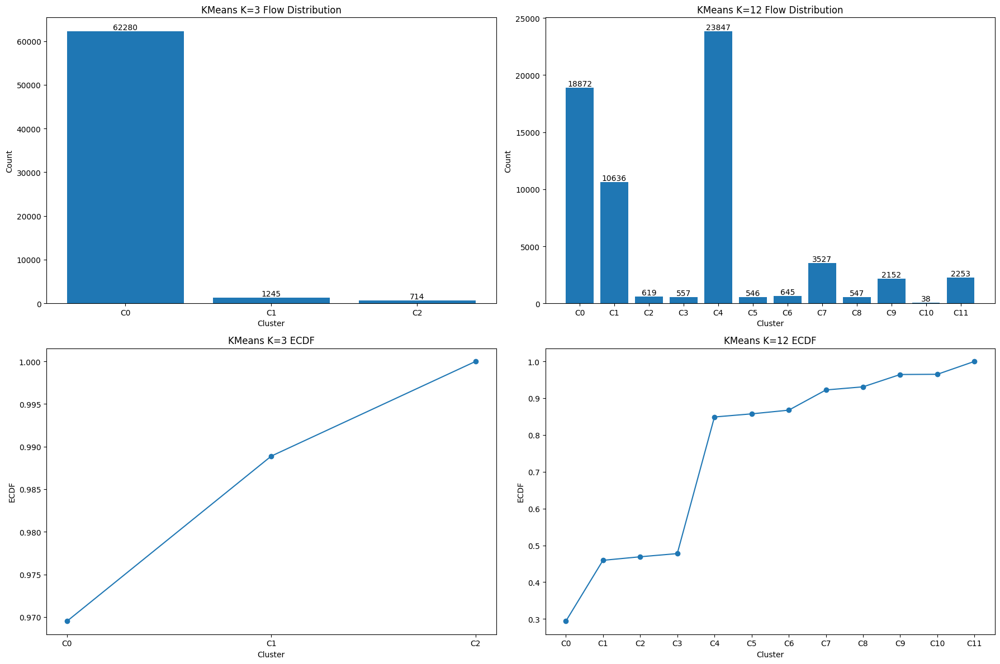

In [520]:
r, c = 2, 2
fig, ax = plt.subplots(r, c, figsize=(18, 12))   

count_map3 = dict(zip(*np.unique(cl_labels3, return_counts=True))) 
flow_per_cls3 = np.bincount(cl_labels3) 
ecdf3 = np.cumsum(flow_per_cls3) / np.sum(flow_per_cls3)

count_map12 = dict(zip(*np.unique(cl_labels12, return_counts=True))) 
flow_per_cls12 = np.bincount(cl_labels12)
ecdf12 = np.cumsum(flow_per_cls12) / np.sum(flow_per_cls12)   

print(count_map3)
print(count_map12)  

ax[0, 0].set_title("KMeans K=3 Flow Distribution")
bars = ax[0, 0].bar( [ f"C{x}" for x in  np.unique(cl_labels3)], np.bincount(cl_labels3))   
for i, bar in enumerate(bars):
    h = bar.get_height()
    ax[0, 0].text(
        bar.get_x() + bar.get_width() / 2.0,
        h,
        f"{h}",
        ha="center",
        va="bottom",
    )
ax[0, 0].set_xlabel("Cluster")
ax[0, 0].set_ylabel("Count")   

ax[0, 1].set_title("KMeans K=12 Flow Distribution")
bars = ax[0, 1].bar( [ f"C{x}" for x in  np.unique(cl_labels12)], np.bincount(cl_labels12))
for i, bar in enumerate(bars):
    h = bar.get_height()
    ax[0, 1].text(
        bar.get_x() + bar.get_width() / 2.0,
        h,
        f"{h}",
        ha="center",
        va="bottom",
    )
ax[0, 1].set_xlabel("Cluster")
ax[0, 1].set_ylabel("Count")

ax[1, 0].set_title("KMeans K=3 ECDF")
ax[1, 0].plot([ f"C{x}" for x in  np.unique(cl_labels3)], ecdf3, marker='o')
ax[1, 0].set_xlabel("Cluster")
ax[1, 0].set_ylabel("ECDF")

ax[1, 1].set_title("KMeans K=12 ECDF")
ax[1, 1].plot([ f"C{x}" for x in  np.unique(cl_labels12)], ecdf12, marker='o')
ax[1, 1].set_xlabel("Cluster")
ax[1, 1].set_ylabel("ECDF")

plt.tight_layout()


plt.show()  




In [521]:
tuned_params = {
    "n_clusters": km3.n_clusters,
    "init": km3.init,   
    "n_init": km3.n_init,
    "random_state": km3.random_state,   
}
print("Tuned KMeans Parameters with k=3:", tuned_params)    

Tuned KMeans Parameters with k=3: {'n_clusters': 3, 'init': 'k-means++', 'n_init': 'auto', 'random_state': 33}


##### PC1 and PC2 Distributions with centroids for k=3 and k=12

KMeans Centroids with k=3: [[-2.75266722e-02  3.54160186e-02  5.58804128e-02  4.77255836e-02
  -5.69612076e-02 -7.52085887e-03 -4.11592381e-02  6.41619408e-03
   5.91897904e-03 -9.59975239e-02  2.29682984e-03  3.52424034e-02
  -1.48619334e-03 -1.07813812e-01 -8.41827191e-02 -1.36294656e-02
  -1.45286055e-02 -3.07412719e-03 -1.26676236e-04  8.17100833e-04
  -2.99042651e-02  7.65255984e-04 -1.74056445e-02 -3.97127752e-02
  -1.32003151e-01 -9.09374821e-02 -6.35457820e-03 -3.62857116e-02
  -2.36833922e-02 -2.45094595e-02 -8.65837494e-02  6.55588312e-02]
 [ 8.85459485e-01 -1.31968148e+00 -1.77519990e+00 -2.08883502e+00
   1.54995705e-01 -5.01677835e-03  1.32546887e+00 -2.19802406e-01
  -1.55086745e-01  3.51514907e+00 -5.07785674e-02 -1.10126322e+00
   6.19828521e-02  4.78908586e-01  2.75367978e-01  5.29380749e-01
   2.33175568e-01  9.77318164e-02  4.03024529e-03 -1.50867981e-02
   1.28242970e+00 -2.43288120e-02  6.30343631e-01  1.86724544e+00
   5.72070566e+00  4.50580382e+00  2.02023045e-0

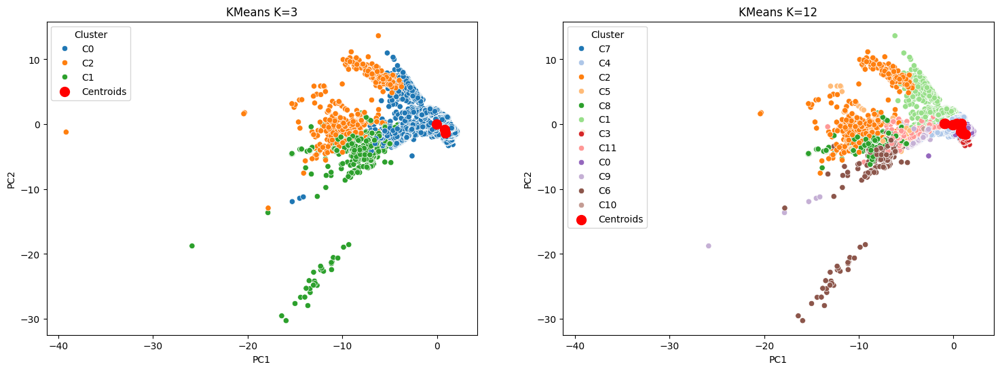

In [522]:
km3_centroids = km3.cluster_centers_    
km12_centroids = km12.cluster_centers_  

print("KMeans Centroids with k=3:", km3_centroids)  
print("KMeans Centroids with k=12:", km12_centroids)    


fig, axs = plt.subplots(1, 2, figsize=(18, 6))   

sns.scatterplot(x="PC1", y="PC2", data=pca_df, hue="cl_label3", palette="tab10",  ax=axs[0])        
axs[0].set_title("KMeans K=3")  
axs[0].scatter(km3_centroids[:, 0], km3_centroids[:, 1], color='red', s=100, label="Centroids")  
axs[0].legend(title="Cluster")

sns.scatterplot(x="PC1", y="PC2", data=pca_df, hue="cl_label12", palette="tab20", ax=axs[1])    
axs[1].set_title("KMeans K=12") 
axs[1].scatter(km12_centroids[:, 0], km12_centroids[:, 1], color='red', s=100, label="Centroids")
axs[1].legend(title="Cluster")  

plt.show()




#### GMM

##### Tried GMM with k = 12 (labels)

In [523]:
nr_labels = len(unique_labels)  

# GMM Clustering with number of clusters equal to the number of unique labels       
gmm = GaussianMixture(n_components=nr_labels, random_state=random_state)

cluster_new_ddos_df = cluster_new_ddos_df[cluster_features] 
display(cluster_new_ddos_df)    

gmm.fit(cluster_new_ddos_df)

print("GMM Means:")
print(gmm.means_)

print("GMM Covariances:")   
print(gmm.covariances_)

print("GMM Weights:")
print(gmm.weights_) 

gmm_probs = gmm.predict_proba(cluster_new_ddos_df)
with np.printoptions(precision=4, suppress=True): 
    print('The degrees of belonging (probabilities) for the samples are:\n', gmm_probs)
      
gmm_labels = gmm.predict(cluster_new_ddos_df)
print('\nThe clustered labels are:\n', gmm_labels)



   

,Source Port,Destination Port,Protocol,Timestamp,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Fwd Packet Length Max,Fwd Packet Length Std,...,URG Flag Count,Down/Up Ratio,Init_Win_bytes_forward,Init_Win_bytes_backward,min_seg_size_forward,Active Mean,Active Std,Idle Std,SimillarHTTP,Inbound
0,-0.996890,1.463534,0.560382,-0.981207,-0.227684,0.169121,-0.051748,1.754276,-0.297075,-0.172277,...,-0.224105,-0.265523,-0.266314,-0.102881,0.202023,-0.044128,-0.034259,-0.165955,-0.086584,0.295752
1,-0.996890,1.463534,0.560382,-0.981205,-0.228947,-0.036372,-0.051748,-0.283738,-0.297075,-0.172277,...,-0.224105,-0.265523,-0.266314,-0.102881,0.202023,-0.044128,-0.034259,-0.165955,-0.086584,-3.381206
2,-0.996890,0.770389,0.560382,-0.981198,-0.226789,0.391920,-0.051748,3.963912,-0.297075,-0.172277,...,-0.224105,-0.265523,-0.266314,-0.102881,0.202023,-0.044128,-0.034259,-0.165955,-0.086584,0.295752
3,-0.996890,-0.924976,0.560382,-0.981189,-0.226799,0.391920,-0.051748,3.963912,-0.297075,-0.172277,...,-0.224105,-0.265523,-0.266314,-0.102881,0.202023,-0.044128,-0.034259,-0.165955,-0.086584,0.295752
4,-0.996890,-0.139438,0.560382,-0.981176,-0.227524,0.391920,-0.051748,3.963912,-0.297075,-0.172277,...,-0.224105,-0.265523,-0.266314,-0.102881,0.202023,-0.044128,-0.034259,-0.165955,-0.086584,0.295752
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64234,0.540571,1.589149,0.560382,0.942099,-0.228947,-0.036372,-0.051748,-0.290077,-0.408056,-0.172277,...,-0.224105,-0.265523,-0.266314,-0.102881,0.202023,-0.044128,-0.034259,-0.165955,-0.086584,0.295752
64235,1.350236,-0.577568,0.560382,0.942099,-0.219513,-0.027720,-0.051748,-0.224841,-0.377323,0.521580,...,-0.224105,-0.265523,-0.266314,-0.102881,0.202023,-0.044128,-0.034259,-0.165955,-0.086584,0.295752
64236,0.843239,1.670387,0.560382,0.942099,-0.228947,-0.036372,-0.051748,-0.290077,-0.408056,-0.172277,...,-0.224105,-0.265523,-0.266314,-0.102881,0.202023,-0.044128,-0.034259,-0.165955,-0.086584,0.295752
64237,1.433360,-0.996433,0.560382,0.942099,-0.224104,-0.032046,-0.051748,-0.256532,-0.384152,0.501315,...,-0.224105,-0.265523,-0.266314,-0.102881,0.202023,-0.044128,-0.034259,-0.165955,-0.086584,0.295752


GMM Means:
[[-4.04869688e-01  1.08341486e-01  5.60381644e-01 -2.43208199e-02
  -2.28945708e-01 -3.63550062e-02 -5.17484576e-02 -2.34992604e-01
   5.48749961e-01 -1.72276774e-01 -1.46260845e-01  5.22353095e-01
  -1.54351047e-02 -1.12383517e-01 -9.06934921e-02 -1.13607529e-01
  -9.60313477e-02  9.13047235e-02  3.94220302e-03 -4.49771014e-02
   3.10887953e-01 -2.43288120e-02 -2.24105242e-01 -2.65523166e-01
  -2.66314478e-01 -1.02881355e-01 -5.21527098e-02 -4.41281846e-02
  -3.42593532e-02 -1.65954834e-01 -8.65837494e-02  2.95752479e-01]
 [ 8.68403754e-01  1.14233022e-01 -1.77720244e+00  1.34301716e+00
   6.82850497e-01 -3.12221927e-02 -3.70350979e-02 -3.26644033e-01
  -1.04832931e+00 -1.72276774e-01 -1.46260845e-01  1.93866960e-02
  -1.54332065e-02 -1.12383435e-01 -9.06929103e-02  1.52637369e-01
  -9.60313477e-02  9.77317988e-02  3.94308730e-03  2.53818815e-02
  -7.09560929e-01 -2.43288120e-02 -2.24105242e-01 -9.04558993e-02
   4.26657339e-01 -1.02833248e-01  2.02023025e-01 -4.41086178e-0

##### GMM Matrix of GMM with k=12

In [524]:
likelihood_avg = gmm.score(cluster_new_ddos_df)
likelihood = gmm.score_samples(cluster_new_ddos_df)  
silhouette = silhouette_score(cluster_new_ddos_df, gmm_labels)  
ri = rand_score(y_int, gmm_labels)  
ari = adjusted_rand_score(y_int, gmm_labels)    

print(f"Log Likelihood Score Average: {likelihood_avg}")  
print(f"Silhouette Score: {silhouette}")    
print(f"Rand Index: {ri}")  
print(f"Adjusted Rand Index: {ari}")

Log Likelihood Score Average: 132.35584292340573
Silhouette Score: 0.2441912644284167
Rand Index: 0.688142185657336
Adjusted Rand Index: 0.1909311698070487


##### Number of components analysis  

In [525]:
# Function to perform GMM clustering used in parallel   
def gmm_clustering(nr_clusters, data):
    gmm = GaussianMixture(n_components=nr_clusters, random_state=random_state)
    gmm.fit(data)

    gmm_labels = gmm.predict(data)
    likelihood_avg = gmm.score(data)
    silhouette = silhouette_score(data, gmm_labels)
    ri = rand_score(y_int, gmm_labels)
    ari = adjusted_rand_score(y_int, gmm_labels)

    return {
        "likelihood_avg": likelihood_avg,
        "silhouette": silhouette,
        "rand_index": ri,
        "adjusted_rand_index": ari,
        "cluster": nr_clusters,
    }

# Perform GMM clustering for different number of clusters in parallel
parallel_jobs = (
    delayed(gmm_clustering)(i, cluster_new_ddos_df)
    for i in range(2, 14)
)   
# Perform the parallel jobs with 4 workers  
results = Parallel(n_jobs=6)(parallel_jobs)

gmm_metrics_records =  pd.DataFrame(results)
gmm_metrics_records = gmm_metrics_records.sort_values(by="cluster").reset_index(drop=True)  

display(gmm_metrics_records)    

,likelihood_avg,silhouette,rand_index,adjusted_rand_index,cluster
0,51.524644,0.512352,0.335443,0.049570,2
1,47.648793,0.504233,0.293790,0.025827,3
2,94.989257,0.223145,0.616660,0.136318,4
3,110.238672,0.305823,0.591830,0.154875,5
4,112.020228,0.316486,0.591800,0.153518,6
5,116.909152,0.215445,0.662924,0.161962,7
6,121.140589,0.327108,0.681427,0.187170,8
7,123.655953,0.327985,0.681522,0.186299,9
8,125.373645,0.309395,0.810571,0.365089,10
9,126.047592,0.312294,0.810497,0.364893,11


In [526]:
# Function to calculate the elbow point for GMM clustering  
def elbow_cal(row): 
    if row.name == 0:   
        return row["likelihood_avg"]
    else:
        return  row["likelihood_avg"] - gmm_metrics_records.iloc[row.name - 1]["likelihood_avg"]   

  
gmm_metrics_records["elbow"] = gmm_metrics_records.apply(lambda row : elbow_cal(row) , axis=1)
display(gmm_metrics_records)

best_silhouette = gmm_metrics_records["silhouette"].max()
best_cls = gmm_metrics_records[gmm_metrics_records["silhouette"] == best_silhouette]["cluster"].values[0]   

print(f"Best number of clusters according to the silhouette score: {best_cls}") 
print(f"Best silhouette score: {best_silhouette}")  

,likelihood_avg,silhouette,rand_index,adjusted_rand_index,cluster,elbow
0,51.524644,0.512352,0.335443,0.049570,2,51.524644
1,47.648793,0.504233,0.293790,0.025827,3,-3.875851
2,94.989257,0.223145,0.616660,0.136318,4,47.340464
3,110.238672,0.305823,0.591830,0.154875,5,15.249415
4,112.020228,0.316486,0.591800,0.153518,6,1.781556
5,116.909152,0.215445,0.662924,0.161962,7,4.888925
6,121.140589,0.327108,0.681427,0.187170,8,4.231437
7,123.655953,0.327985,0.681522,0.186299,9,2.515364
8,125.373645,0.309395,0.810571,0.365089,10,1.717692
9,126.047592,0.312294,0.810497,0.364893,11,0.673948


Best number of clusters according to the silhouette score: 2
Best silhouette score: 0.5123516558313553


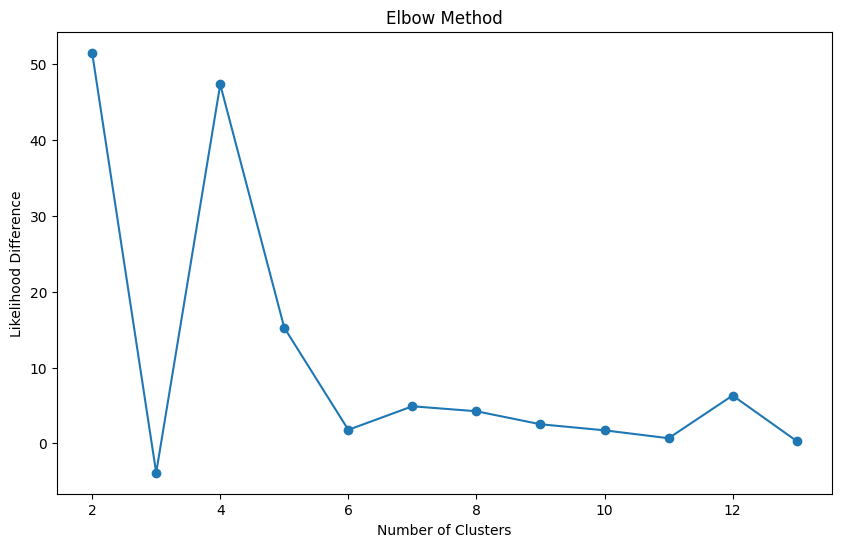

In [527]:
plt.figure(figsize=(10, 6)) 
plt.plot(gmm_metrics_records["cluster"], gmm_metrics_records["elbow"], marker='o')  
plt.title("Elbow Method")   
plt.xlabel("Number of Clusters")    
plt.ylabel("Likelihood Difference")   
  
plt.show()

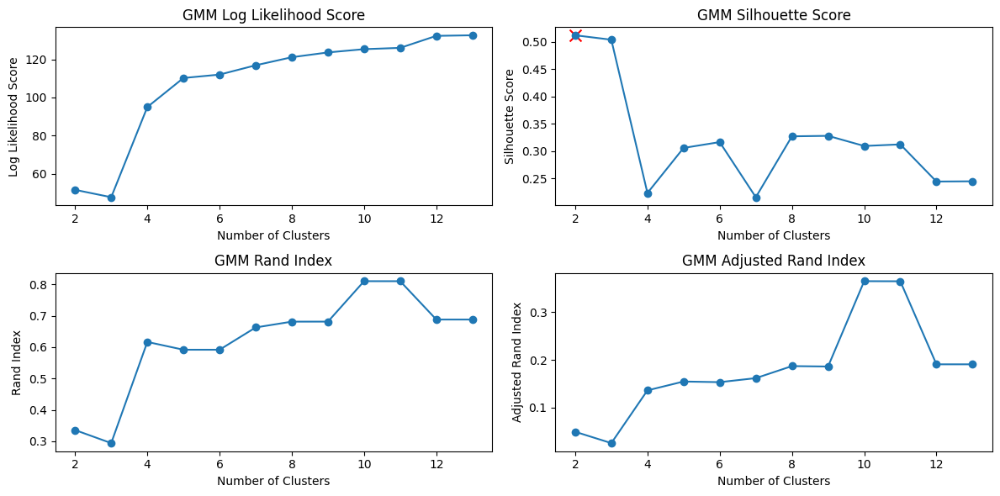

In [528]:
r, c = 2, 2 

fig, ax = plt.subplots(r, c, figsize=(12, 6))      

ax[0, 0].plot(gmm_metrics_records["cluster"], gmm_metrics_records["likelihood_avg"], marker='o')    
ax[0, 0].set_title("GMM Log Likelihood Score")
ax[0, 0].set_xlabel("Number of Clusters")
ax[0, 0].set_ylabel("Log Likelihood Score")


ax[0, 1].plot(gmm_metrics_records["cluster"], gmm_metrics_records["silhouette"], marker='o')  
ax[0, 1].scatter(best_cls, best_silhouette, color='red', marker='x', s=100)    
ax[0, 1].set_title("GMM Silhouette Score")
ax[0, 1].set_xlabel("Number of Clusters")
ax[0, 1].set_ylabel("Silhouette Score")

ax[1, 0].plot(gmm_metrics_records["cluster"], gmm_metrics_records["rand_index"], marker='o')    
ax[1, 0].set_title("GMM Rand Index")
ax[1, 0].set_xlabel("Number of Clusters")
ax[1, 0].set_ylabel("Rand Index")

ax[1, 1].plot(gmm_metrics_records["cluster"], gmm_metrics_records["adjusted_rand_index"], marker='o')
ax[1, 1].set_title("GMM Adjusted Rand Index")
ax[1, 1].set_xlabel("Number of Clusters")
ax[1, 1].set_ylabel("Adjusted Rand Index")
plt.tight_layout()
plt.show()

#### 2PCs data distribution for GMM(k=8) and GMM(k=12)

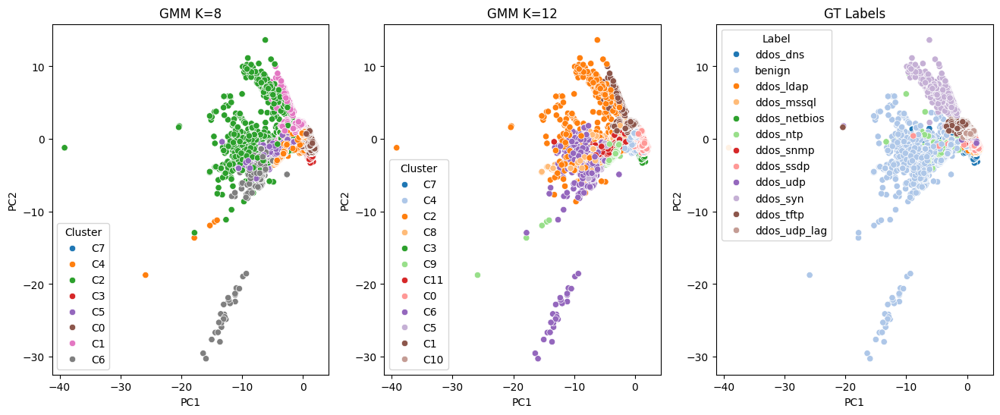

In [529]:
best_gnn = 8 #according to the silhouette score and likelihood elbow method   

# GMM Clustering with best number of clusters
gmm8 = GaussianMixture(n_components=best_gnn, random_state=random_state)
gnn8_labels = gmm8.fit_predict(cluster_new_ddos_df)  
pca_df['gmm8_cluster'] = [f"C{i}" for i in gnn8_labels]

gmm12 = GaussianMixture(n_components=initial_n, random_state=random_state)  
gmm12_labels = gmm12.fit_predict(cluster_new_ddos_df)
pca_df['gmm12_cluster'] = [f"C{i}" for i in gmm12_labels]


fig, ax = plt.subplots(1, 3, figsize=(16, 6))

sns.scatterplot(x="PC1", y="PC2", data=pca_df, hue="gmm8_cluster", palette="tab10", ax=ax[0])   
ax[0].set_title("GMM K=8") 
ax[0].legend(title="Cluster") 

sns.scatterplot(x="PC1", y="PC2", data=pca_df, hue="gmm12_cluster", palette="tab20", ax=ax[1])
ax[1].set_title("GMM K=12")
ax[1].legend(title="Cluster")

sns.scatterplot(x="PC1", y="PC2", data=pca_df, hue="label", palette="tab20", ax=ax[2])  
ax[2].set_title("GT Labels")  
ax[2].legend(title="Label")       

plt.show()  


##### 2PCs distribution including centroids

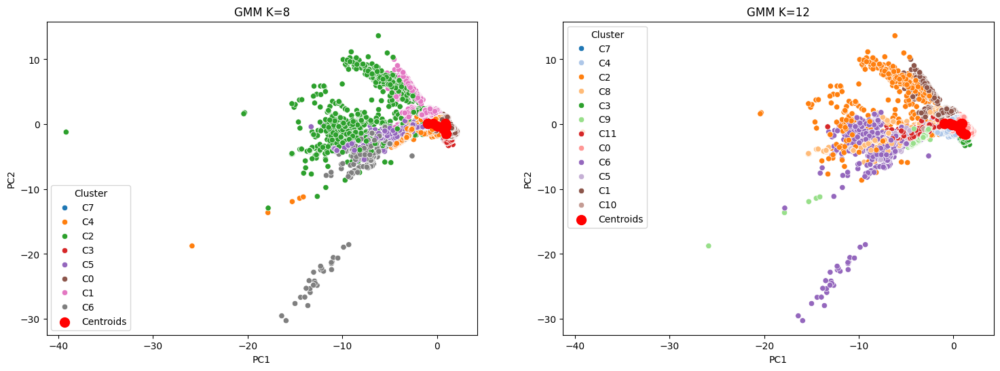

In [530]:
gmm8_centroids = gmm8.means_
gmm12_centroids = gmm12.means_

fig, ax = plt.subplots(1, 2, figsize=(18, 6))   

sns.scatterplot(x="PC1", y="PC2", data=pca_df, hue="gmm8_cluster", palette="tab10",  ax=ax[0])
ax[0].set_title("GMM K=8")
ax[0].scatter(gmm8_centroids[:, 0], gmm8_centroids[:, 1], color='red', s=100, label="Centroids")
ax[0].legend(title="Cluster")

sns.scatterplot(x="PC1", y="PC2", data=pca_df, hue="gmm12_cluster", palette="tab20", ax=ax[1])
ax[1].set_title("GMM K=12")
ax[1].scatter(gmm12_centroids[:, 0], gmm12_centroids[:, 1], color='red', s=100, label="Centroids")
ax[1].legend(title="Cluster")

plt.show()

##### ECDF and Flow Distribution

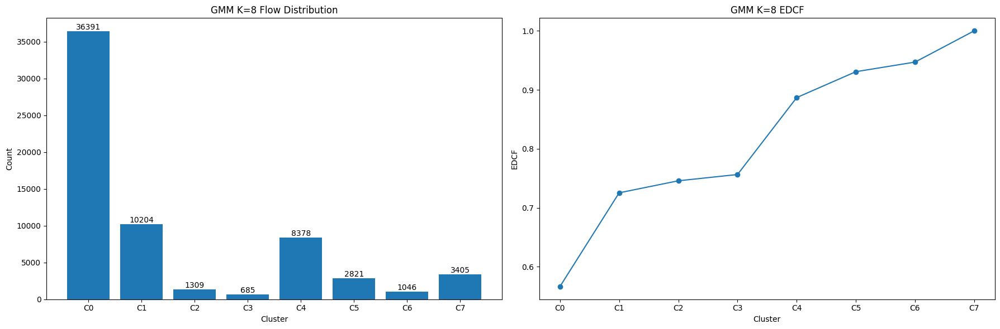

In [531]:
count_map8 = dict(zip(*np.unique(gnn8_labels, return_counts=True))) 
flows_per_cluster8 = np.bincount(gnn8_labels)   
edcf_cluster8 = np.cumsum(flows_per_cluster8) / len(gnn8_labels) 

fig, ax = plt.subplots(1, 2, figsize=(18, 6))

# GMM K=8 Flow Distribution 
ax[0].set_title("GMM K=8 Flow Distribution")  
bars = ax[0].bar( [ f"C{x}" for x in  np.unique(gnn8_labels)], np.bincount(gnn8_labels))   
for i, bar in enumerate(bars):
    h = bar.get_height()
    ax[0].text(
        bar.get_x() + bar.get_width() / 2.0,
        h,
        f"{h}",
        ha="center",
        va="bottom",
    )
ax[0].set_xlabel("Cluster")
ax[0].set_ylabel("Count")   

ax[1].set_title("GMM K=8 EDCF")
ax[1].plot( [ f"C{x}" for x in  np.unique(gnn8_labels)], edcf_cluster8 , marker='o') 
ax[1].set_xlabel("Cluster") 
ax[1].set_ylabel("EDCF")    
  
plt.tight_layout()

plt.show()



##### Silhouette Analysis

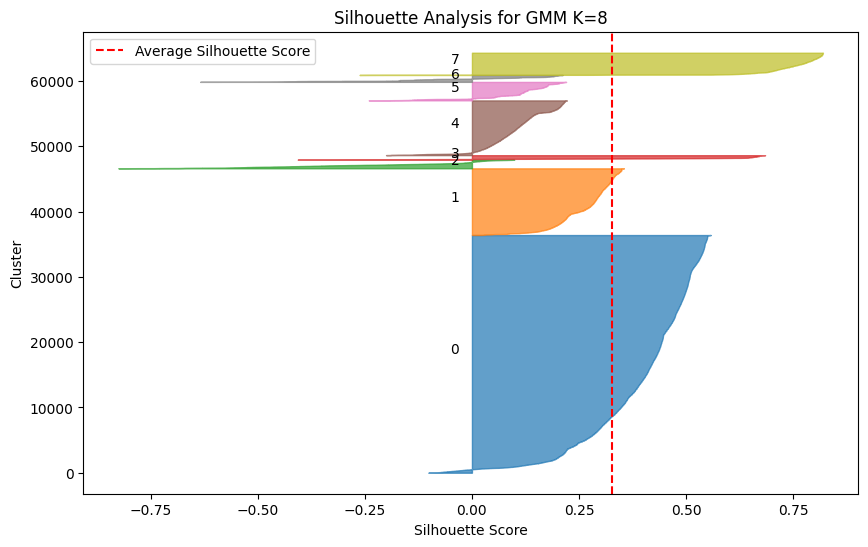

In [532]:

job1 = delayed(silhouette_samples)(cluster_new_ddos_df, gnn8_labels)    
job2 = delayed(silhouette_score)(cluster_new_ddos_df, gnn8_labels)  

silhouette_values, silhouette_avg = Parallel(n_jobs=2)([job1, job2])    

y_lower = 10
# Silhouette Analysis for GMM K=8   
plt.figure(figsize=(10, 6)) 
for i in range(best_gnn): 
    cluster_silhouette_values = silhouette_values[gnn8_labels == i]
    cluster_silhouette_values.sort()
    cluster_size = cluster_silhouette_values.shape[0]
    y_upper = y_lower + cluster_size
    color = plt.cm.tab10(i / best_gnn)
    plt.fill_betweenx(np.arange(y_lower, y_upper), 0, cluster_silhouette_values, facecolor=color, edgecolor=color, alpha=0.7)
    plt.text(-0.05, y_lower + 0.5 * cluster_size, str(i))
    y_lower = y_upper + 10

plt.axvline(x=silhouette_avg, color="red", linestyle="--", label="Average Silhouette Score")
plt.title("Silhouette Analysis for GMM K=8") 
plt.xlabel("Silhouette Score")
plt.ylabel("Cluster")
plt.legend()
plt.show()


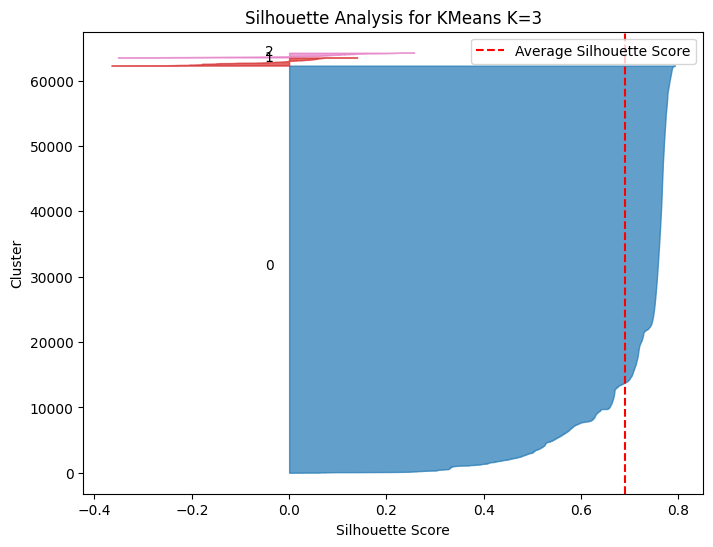

In [533]:
job1 = delayed(silhouette_samples)(cluster_new_ddos_df, cl_labels3) 
job2 = delayed(silhouette_score)(cluster_new_ddos_df, cl_labels3)       

silhouette_values, silhouette_avg = Parallel(n_jobs=2)([job1, job2])    

y_lower = 10    
plt.figure(figsize=(8, 6)) 

for i in range(best_n): 
    cluster_silhouette_values = silhouette_values[cl_labels3 == i]
    cluster_silhouette_values.sort()
    cluster_size = cluster_silhouette_values.shape[0]
    y_upper = y_lower + cluster_size
    color = plt.cm.tab10(i / best_n)
    plt.fill_betweenx(np.arange(y_lower, y_upper), 0, cluster_silhouette_values, facecolor=color, edgecolor=color, alpha=0.7)
    plt.text(-0.05, y_lower + 0.5 * cluster_size, str(i))
    y_lower = y_upper + 10  

plt.axvline(x=silhouette_avg, color="red", linestyle="--", label="Average Silhouette Score")
plt.title("Silhouette Analysis for KMeans K=3")
plt.xlabel("Silhouette Score")
plt.ylabel("Cluster")
plt.legend()
plt.show()
